# UK Census Microdata Analysis

The aim of this notebook is to look at the [microdata](https://census.ukdataservice.ac.uk/use-data/guides/microdata.aspx) available for UK Census 2011. In particular, the England-Wales dataset which has 2.8 million samples. We wish to look at key Blau dimensions of interest, so that we can align our own survey's design along with the census.

Different kinds of microdata have been made available (w/o a special license) corresponding to different geographical granularity. We consider the dataset at the local authority level (also referred to as boroughs in London, and council areas in Scotland). The dataset is available at a *grouped* LA level, wherein a few LAs can be grouped such that each grouped-LA contains roughly 120,000 people.

First, we write a function to import any census microdata file.

In [562]:
def import_data(name=('2011', 'ew'), memory_map=True, datapath='./census/'):
    import pandas as pd
    datadict = {(2001, 'isar'):'UKDA-7205-tab/tab/01uklicind-20061002.tab',
                (2001, 'sam'):'UKDA-7207-tab/tab/01uklicsam-20070301.tab',
                (2011, 'ew'):'UKDA-7682-tab/tab/recodev12.tab',
                (2011, 'n'):'UKDA-7770-tab/tab/ni_safeguarded_la.tab',
                (2011, 's'):'UKDA-7835-tab/tab/safeguarded_grouped_la.tab'
               }
    geogdict = {(2001, 'isar'):'region',
                (2001, 'sam'):'lacode',
                (2011, 'ew'):'la_group',
                (2011, 'n'):'LA_CODE_14',
                (2011, 's'):'COUNCIL_AREA_GROUP'
               }
    datapath += datadict[name]
    df = pd.read_table(datapath, memory_map=memory_map)
    df.rename(columns={geogdict[name]:'geocode'}, inplace=True)
    return df

In [563]:
data_2011_ew = import_data((2011, 'ew'))

In [565]:
data_2011_ew.shape

(2848149, 121)

We would also like to import a dictionary which has names of the GLAs, so that they can be plotted on a map.

In [607]:
def import_geo_dict(name=('2011', 'ew'), region=None, datapath='./census/'):
    datadict = {(2001, 'isar'):'UKDA-7205-tab/tab/geography',
                (2001, 'sam'):'UKDA-7207-tab/tab/geography',
                (2011, 'ew'):'UKDA-7682-tab/tab/geography',
                (2011, 'n'):'UKDA-7770-tab/tab/geography',
                (2011, 's'):'UKDA-7835-tab/tab/geography'
               }
    if region is not None: datapath += datadict[name]+'_'+region+'.txt'
    else: datapath += datadict[name]+'.txt'
    with open(datapath, 'r') as fd:
        geo = [x.strip() for x in fd.readlines()]
    flag = ['\t' in x for x in geo]
    if all(flag):
        geo = [x.split('\t') for x in geo]
        return dict([(x[1], int(x[0])) for x in geo])
    elif any(flag): raise RuntimeError('file formatting is inconsistent; check tabs')
    else: return dict(zip(geo, range(1, len(geo)+1)))

In [635]:
ew_geo_dict = import_geo_dict((2011, 'ew'))

Now, we use a map object made available at [Edina](https://borders.ukdataservice.ac.uk/easy_download_data.html?data=Ew_groupedla_2011) which has specifically the GLAs used in this dataset. We can draw this map out by reading this map object file.

In [615]:
def import_map(datapath='./maps/', region='e'):
    """
    Returns a map object for the UK.
    
    Uses:
        1. pyshp (https://github.com/GeospatialPython/pyshp) for parsing ShapeFile
        2. shapely (https://shapely.readthedocs.io/en/latest/manual.html) for polygon object class
    """
    if region in ['e', 'w', 'l'] : datapath += 'Ew_groupedla_2011/ew_groupedla_2011'
    elif region=='s': datapath += 'Scotland_groupedla_2011/scotland_groupedca_2011'
    else: raise ValueError('valid regions are "l" (London), "e" (England), "w" (Wales) and "s" (Scotland)')
    from shapefile import Reader
    from shapely.geometry import Polygon
    sf = Reader(datapath+'.shp')
    polygons = dict()
    lab_dict = dict()
    for x in sf.shapeRecords():
        idx = x.record[0]
        name = x.record[1]
        lab_dict[name] = idx
        parts = list(x.shape.parts) + [len(x.shape.points)]
        polygons[idx] = (name, list())
        for i in range(len(parts)-1):
            polygons[idx][1].append(Polygon(x.shape.points[parts[i]:parts[i+1]]))
    return polygons, lab_dict

In [657]:
def draw_map(map_object, color=None, cmap='Paired', title=None, colorbar=False, plot_thresh=0.0, ignore=False, size='l', label=False):
    """
    Plots a map object.
    
    Uses:
        1. shapely (https://shapely.readthedocs.io/en/latest/manual.html) for polygon object class
        2. descartes (https://pypi.org/project/descartes/) for plotting polygon objects
    """
    import matplotlib.pyplot as plt
    from matplotlib.colors import Normalize
    from descartes.patch import PolygonPatch
    if color is None: color=12
    if isinstance(color, int):
        from random import randint
        color = [randint(1, color) for s in map_object]    
    if not isinstance(color, dict): color = dict(zip(map_object.keys(), color))
    vmin = min(color.values())
    vmax = max(color.values())
    if vmax < plot_thresh: return
    norm = Normalize(vmin=vmin, vmax=vmax)
    if isinstance(cmap, str): cmap = plt.cm.get_cmap(cmap)
    size_dict = {'l':360, 'm':180, 's':90}
    fig = plt.figure(1, dpi=size_dict[size])
    ax = plt.subplot(1,1,1)
    for key, shape in map_object.items():
        if key in color or not ignore:
            lab_flag = label
            for s in shape[1]:
                x, y = s.exterior.xy
                ax.plot(x, y, alpha=0)
                if key in color: c = cmap(norm(color[key]))
                else: c = 'black'
                ax.add_patch(PolygonPatch(s, facecolor=c, edgecolor='black', linewidth=0.2, label=shape[0]))
                if lab_flag:
                    x_coord, y_coord = s.centroid.coords[0]
                    plt.text(x_coord, y_coord, str(shape[0]), ha='center', va='center', fontsize=4)
                    lab_flag = False
    if title is not None: ax.set_title(title)
    ax.set_aspect(1)
    if colorbar:
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm._A = []
        plt.colorbar(sm)
    plt.axis('off')
    plt.show()  

In [617]:
ew_gla_map, ew_gla_dict = import_map()

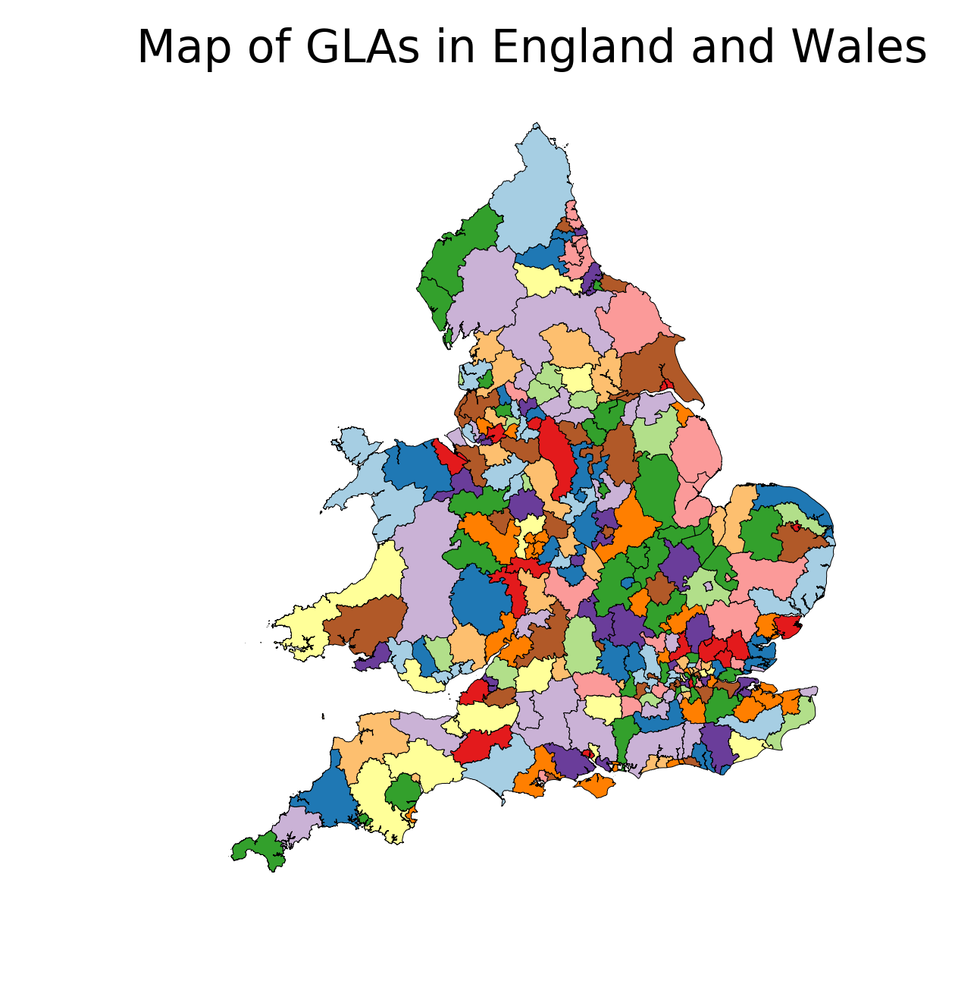

In [618]:
draw_map(ew_gla_map, title='Map of GLAs in England and Wales')

We also write a helper function to map the census-geography to map-GLAs.

In [804]:
def geo2gla(geo_dict, gla_dict, verbose=True, substring=True):
    geo2gla_dict = dict()
    glas = list(gla_dict.keys())
    for key, val in geo_dict.items():
        if key in glas: geo2gla_dict[val] = gla_dict[key]
        elif substring:
            found = False
            for gla in glas:
                if key in gla:
                    geo2gla_dict[val] = gla_dict[gla]
                    found = True
                    if verbose: print('warning, only a substring-matched grouped-LA --', gla, '-- found for:', key)
                    break
            if not found and verbose: print('warning, no matching grouped-LA found for:', key)
    return geo2gla_dict

In [805]:
ew_geo2gla_dict = geo2gla(ew_geo_dict, ew_gla_dict)

warning, no matching grouped-LA found for: Bridgend


Unfortunately, one of the census-geographies "Bridgend" doesn't have a corresponding GLA on the map. Anyway, we can still plot summary statistics of various attributes for the remaining geographies on their corresponding GLAs. For continuous attributes, we can plot the mean. For categoricals, we can plot the proportion of a category on separate plots.

In [819]:
def attribute_by_geo(df, attribute, geo2gla_dict=None, map_object=None, mean=False, ignore=[-9], plot_thresh=0.1, ignore_missing=False, label=False):
    from numpy import nan
    df_oi = df[['geocode', attribute]].replace({attribute: dict(zip(ignore, [nan for i in ignore]))})
    df_oi = df_oi.groupby('geocode')[attribute]
    if mean: df_oi = df_oi.mean()
    else: df_oi = df_oi.value_counts()/df_oi.count() #normalized counts
    if geo2gla_dict is not None and map_object is not None:
        def map_att(df_oi, title):
            colors = dict([(i, []) for i in map_object])
            for i in df_oi.index:
                if i in geo2gla_dict: colors[geo2gla_dict[i]].append(df_oi[i])
            for key in map_object:
                if colors[key]!=[]: colors[key] = sum(colors[key])/len(colors[key])
                else: del colors[key]
            draw_map(map_object, color=colors, cmap='Spectral', title=title, colorbar=True, plot_thresh=plot_thresh, ignore=ignore_missing, size='m', label=label)
            
        if mean: map_att(df_oi, title=attribute+' mean by region')
        else:
            for lab in df_oi.index.levels[1]:
                map_att(df_oi.loc[:,lab], title=attribute+' '+str(lab)+' by region')
    return df_oi

Say we want to plot sex of the respondents, which is a categorical.

	Value = 1	Label = Male
	Value = 2	Label = Female

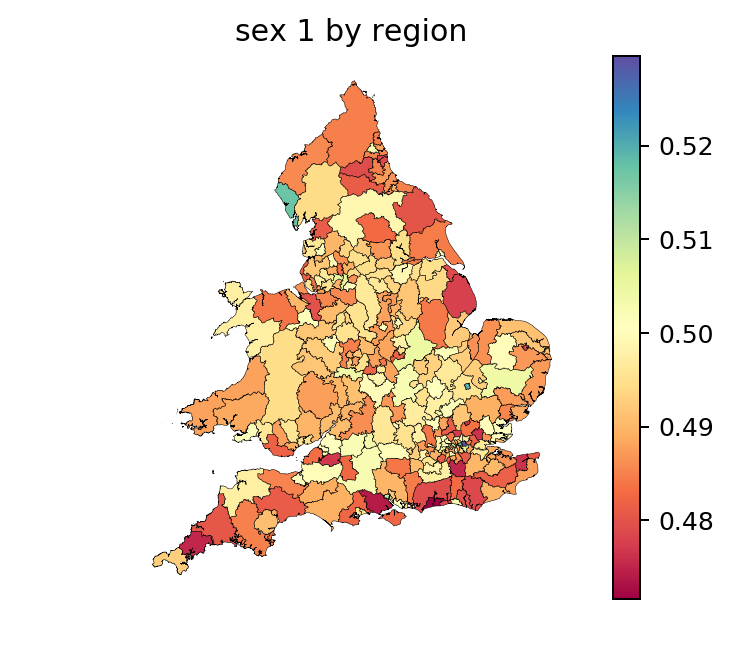

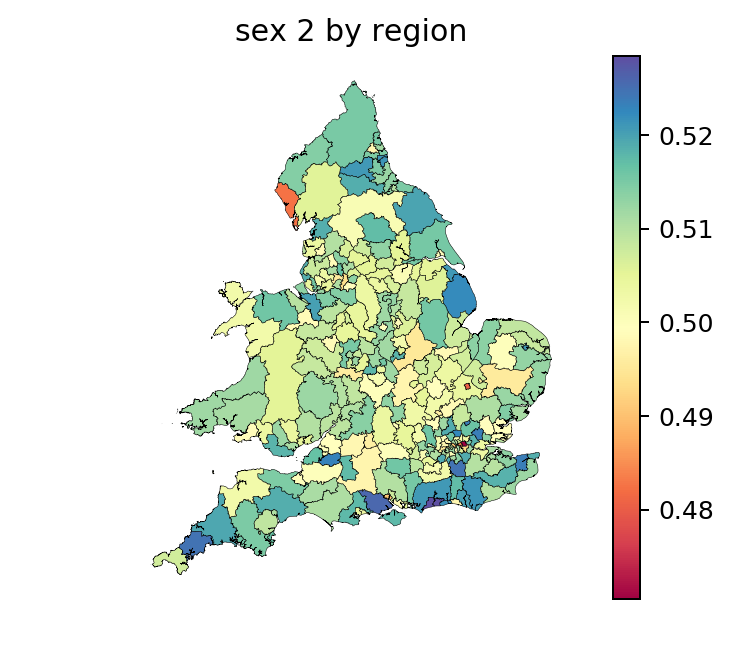

In [637]:
sex_by_geo_ew = attribute_by_geo(data_2011_ew, 'sex', ew_geo2gla_dict, ew_gla_map)

The survey asks an interesting question about the state of "general health" of the respondent over the last twelve months. Since it is an ordinal categorical, we plot the mean value on a single map of England-Wales.

	Value = 1.0	Label = Very good health
	Value = 2.0	Label = Good health
	Value = 3.0	Label = Fair health
	Value = 4.0	Label = Bad health
	Value = 5.0	Label = Very bad health

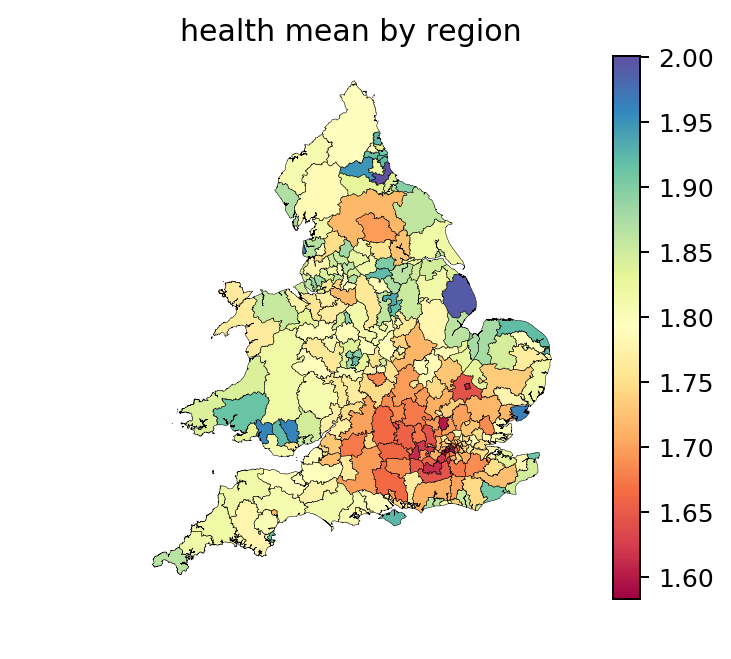

In [638]:
health_by_geo_ew = attribute_by_geo(data_2011_ew, 'health', ew_geo2gla_dict, ew_gla_map, mean=True)

Clearly, areas in south-east England tend to have a much better health than the rest of England and Wales. In particular, Lincolnshire has the worst general health.

Below, we look at age, which is encoded as a categorical ordinal with bin-size of 5 years.

	Value = 1.0	Label = 0-4
	Value = 2.0	Label = 5-9
	Value = 3.0	Label = 10-15
	Value = 4.0	Label = 16-18
	Value = 5.0	Label = 19-24
	Value = 6.0	Label = 25-29
	Value = 7.0	Label = 30-34
	Value = 8.0	Label = 35-39
	Value = 9.0	Label = 40-44
	Value = 10.0	Label = 45-49
	Value = 11.0	Label = 50-54
	Value = 12.0	Label = 55-59
	Value = 13.0	Label = 60-64
	Value = 14.0	Label = 65-69
	Value = 15.0	Label = 70-74
	Value = 16.0	Label = 75-79
	Value = 17.0	Label = 80-84
	Value = 18.0	Label = 85-89
	Value = 19.0	Label = 90+

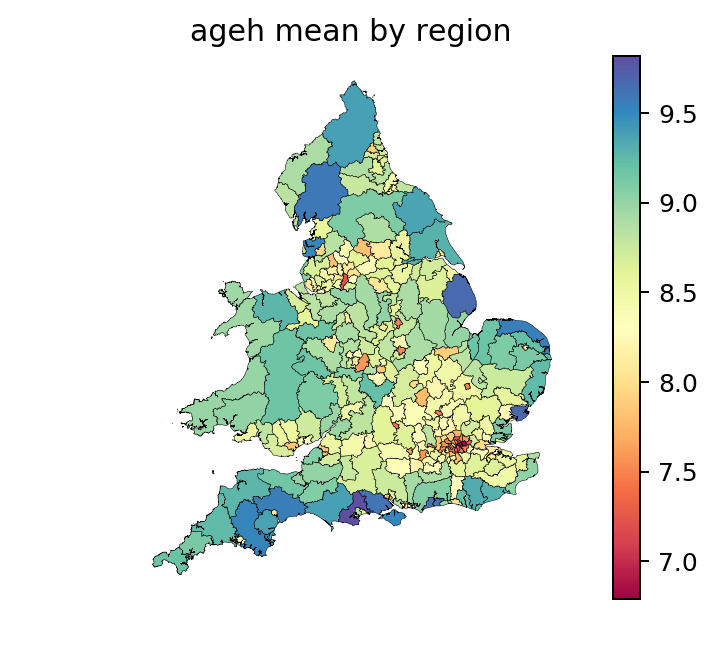

In [640]:
age_by_geo_ew = attribute_by_geo(data_2011_ew, 'ageh', ew_geo2gla_dict, ew_gla_map, mean=True)

We can notice that the "healthier" parts are apparently the younger ones.

Below, we look at the highest education qualification, which are ordinal categoricals. But since these categories are quite distinct, we do not take a mean, and plot proportions of each qualification category instead.

	Value = 10.0	Label = No academic or professional qualifications
	Value = 11.0	Label = Level 1 (0-4 GCSE, O level, or equivalents)
	Value = 12.0	Label = Level 2 (5+ GCSE, O level, 1 A level, or equivalents)
	Value = 13.0	Label = Apprenticeship
	Value = 14.0	Label = Level 3 (2+ A levels, or equivalents)
	Value = 15.0	Label = Level 4+ (degree, postgrad, professional quals)
	Value = 16.0	Label = Other (vocational/foreign/outside UK quals)

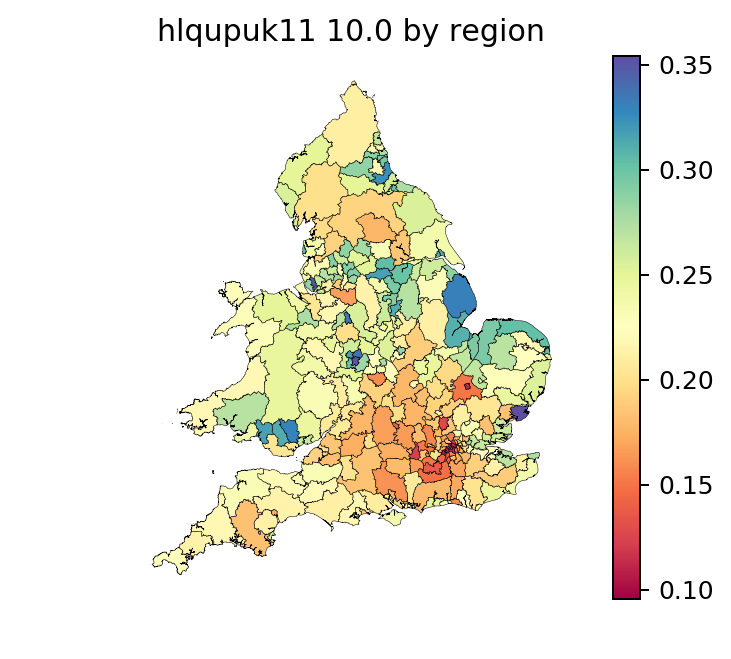

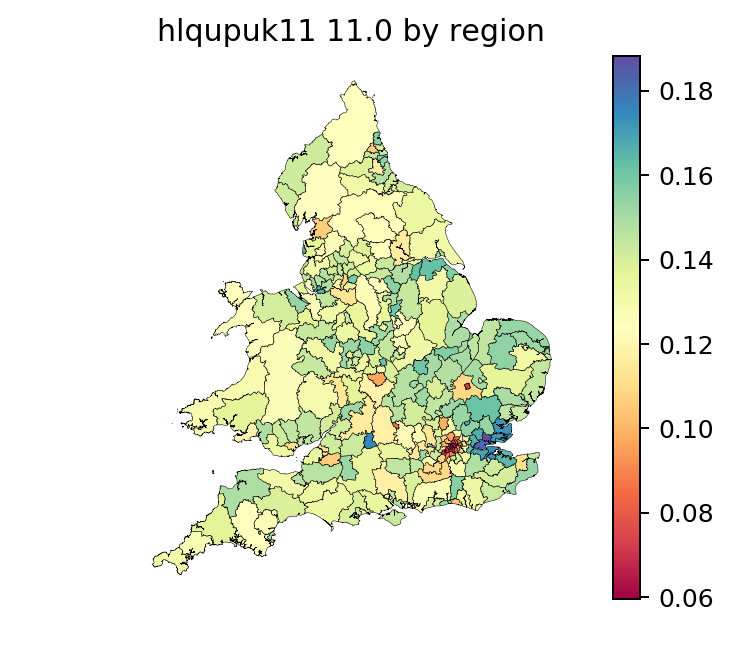

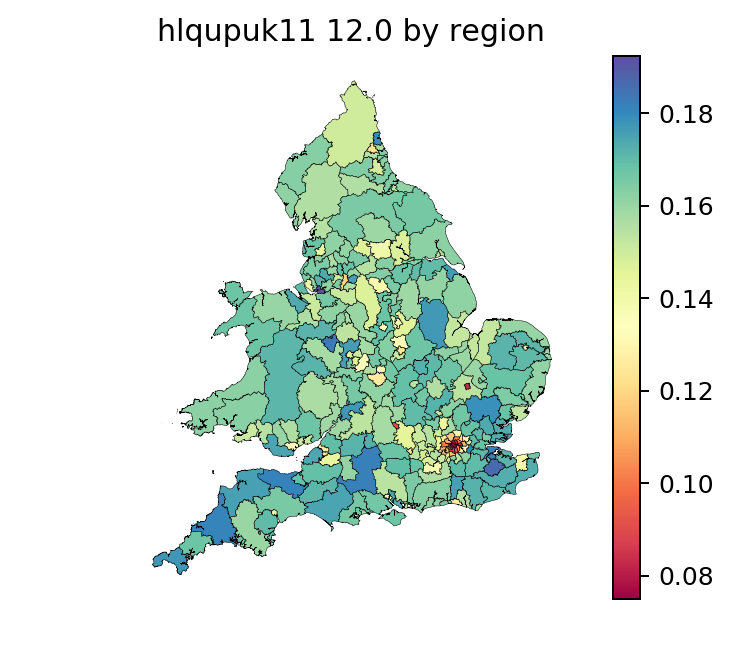

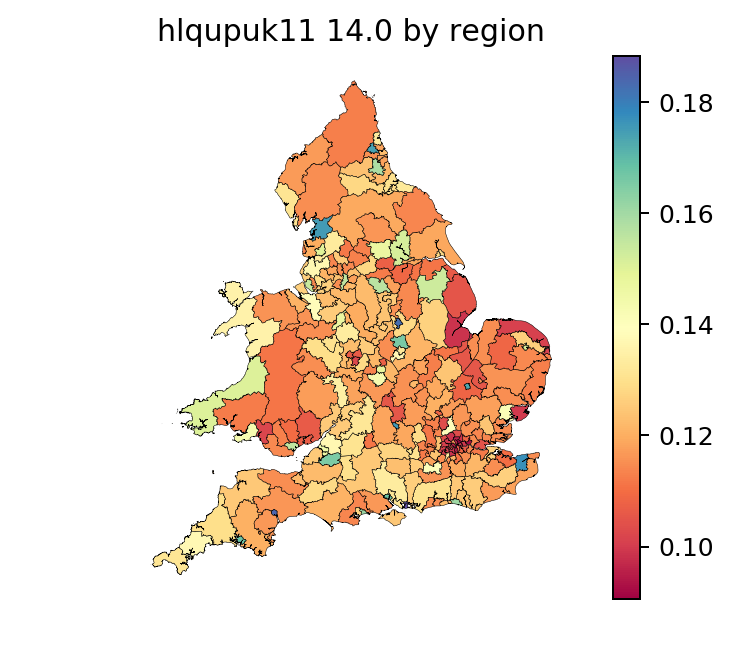

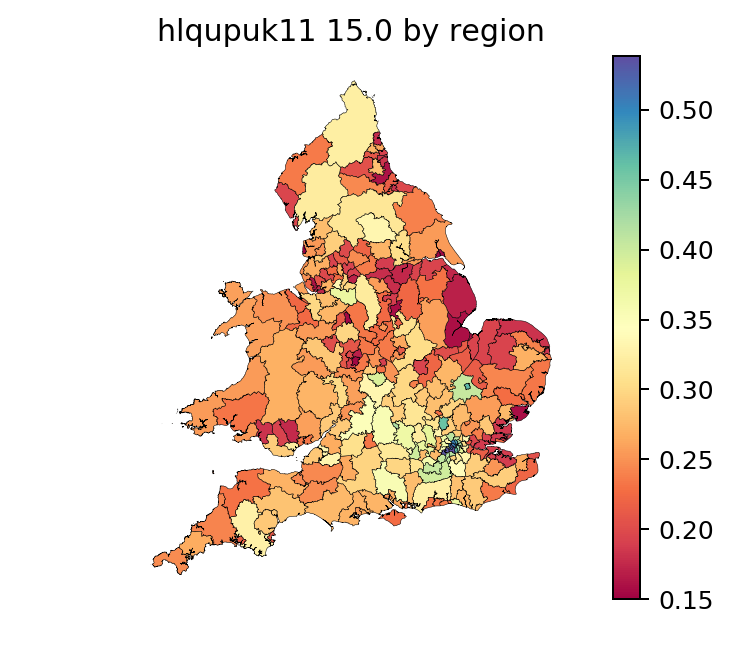

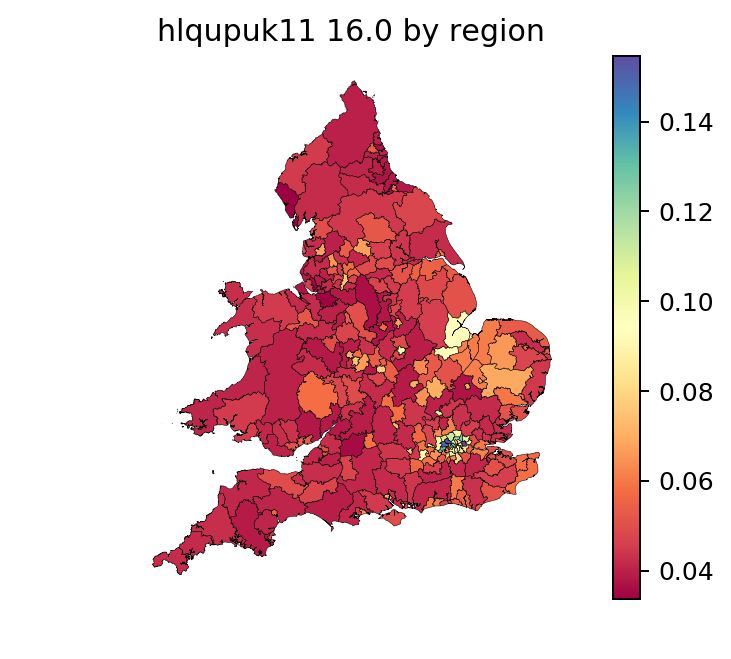

In [660]:
edu_by_geo_ew = attribute_by_geo(data_2011_ew, 'hlqupuk11', ew_geo2gla_dict, ew_gla_map)

It is easy to spot the variation in education across England and Wales. In particular, there is a high concentration of qualified people in urban centers such as London or Manchester, and university towns such as Oxford and Cambridge. Another interesting pattern is the concentration of apprenticeships in London. 

To understand such "local" patterns better, we can focus the map to just London. We read the London-filtered geography file, and map it accordingly.

In [642]:
lon_geo_dict = import_geo_dict((2011, 'ew'), 'l')
lon_geo2gla_dict = geo2gla(lon_geo_dict, ew_gla_dict)

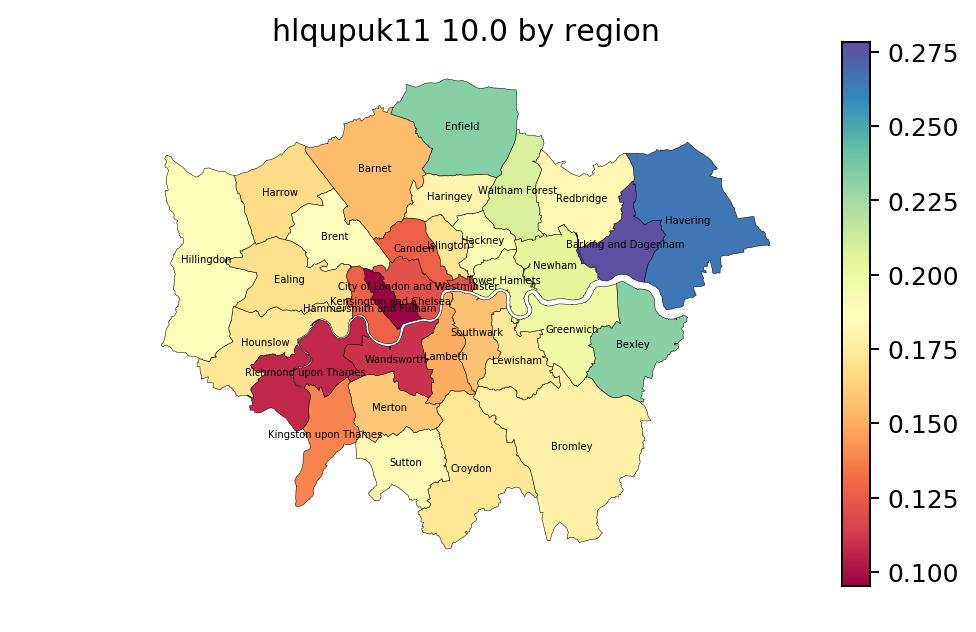

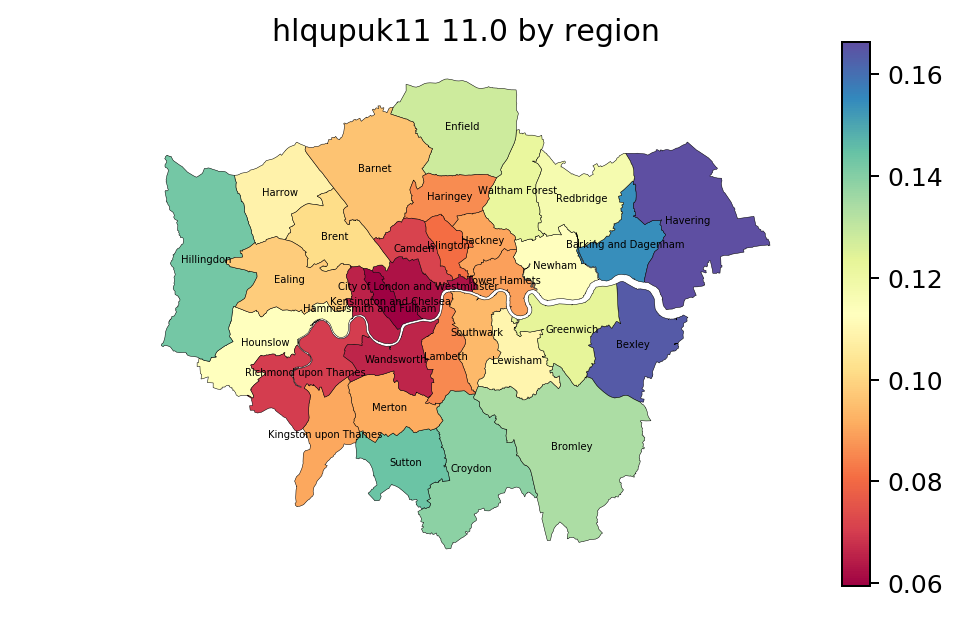

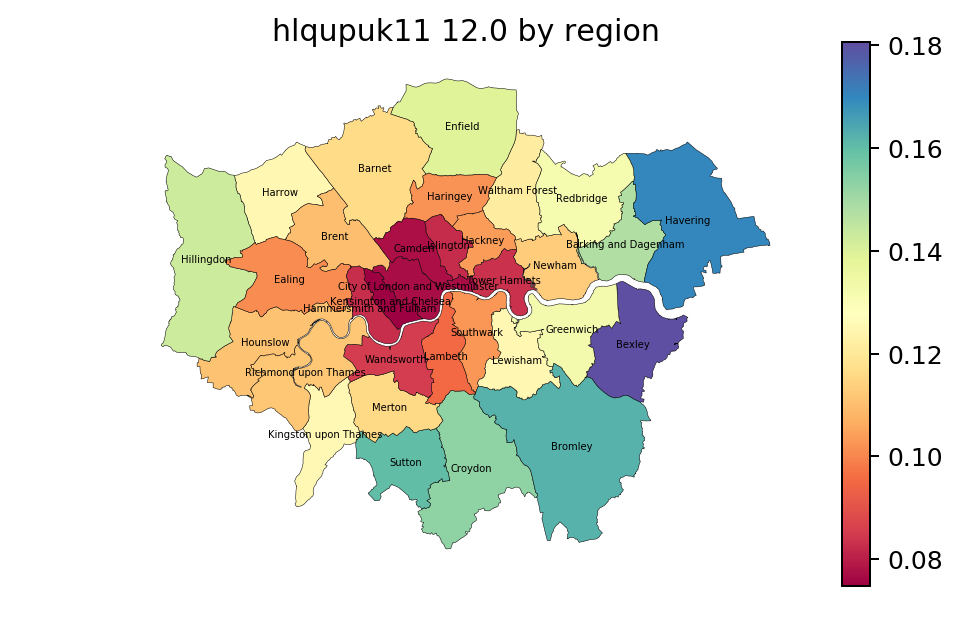

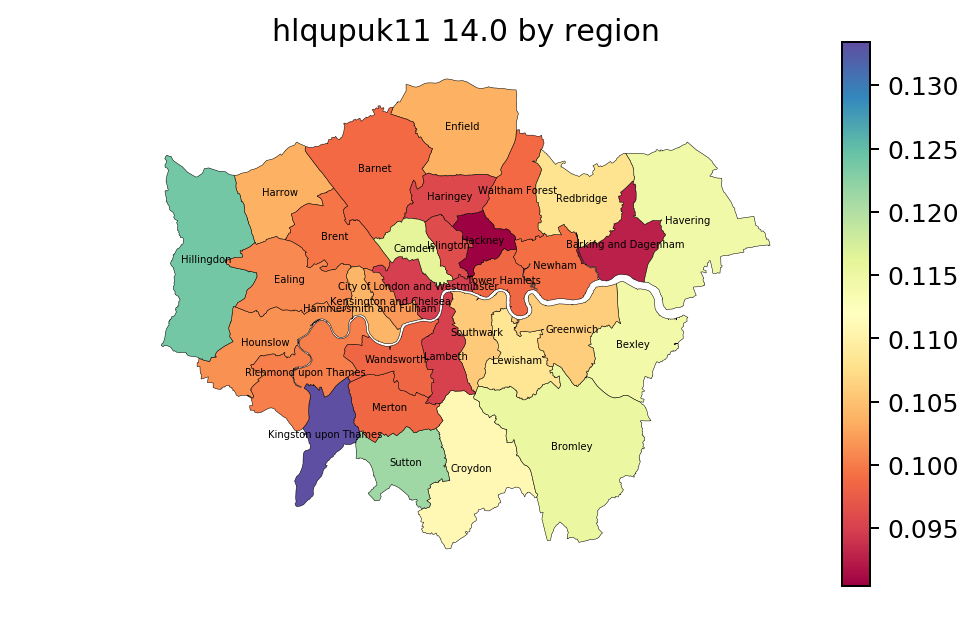

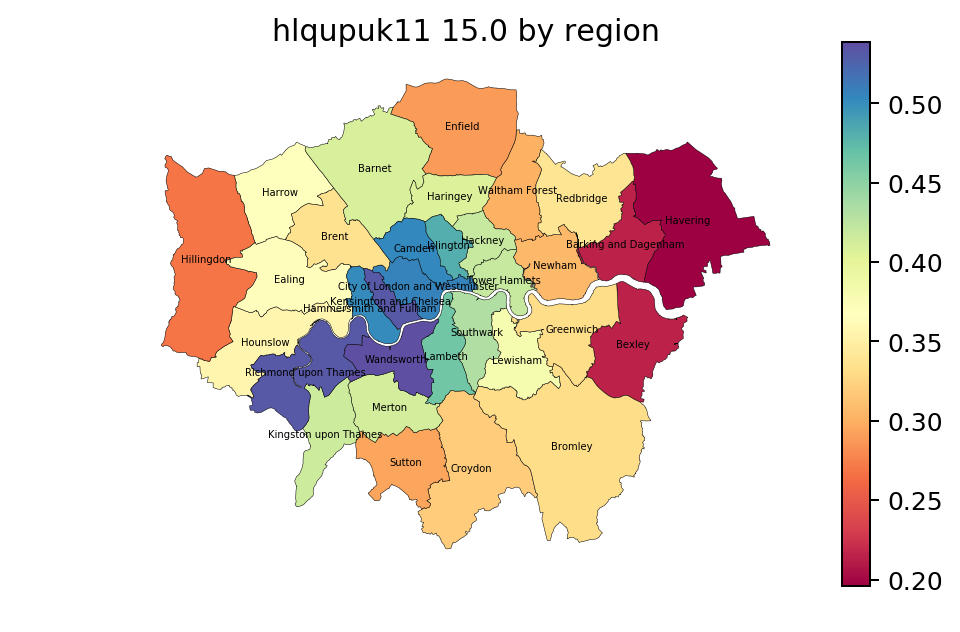

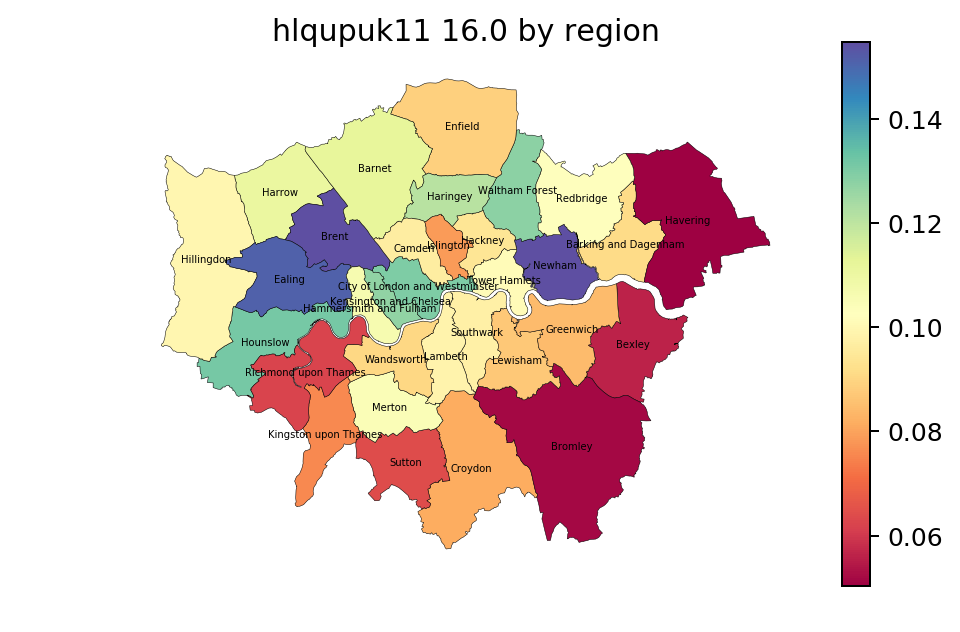

In [666]:
edu_by_geo_lon = attribute_by_geo(data_2011_ew, 'hlqupuk11', lon_geo2gla_dict, ew_gla_map, ignore_missing=True, label=True)

We can now see an interesting pattern of which borough receive little formal education, and which receive more formal education. Another variable of interest here is the social grade, which could be a proxy for income.

    A	upper middle class
    B	middle class
    C1	lower middle class
    C2	skilled working class
    D	working class
    E	non working

	Value = 1.0	Label = AB
	Value = 2.0	Label = C1
	Value = 3.0	Label = C2
	Value = 4.0	Label = DE

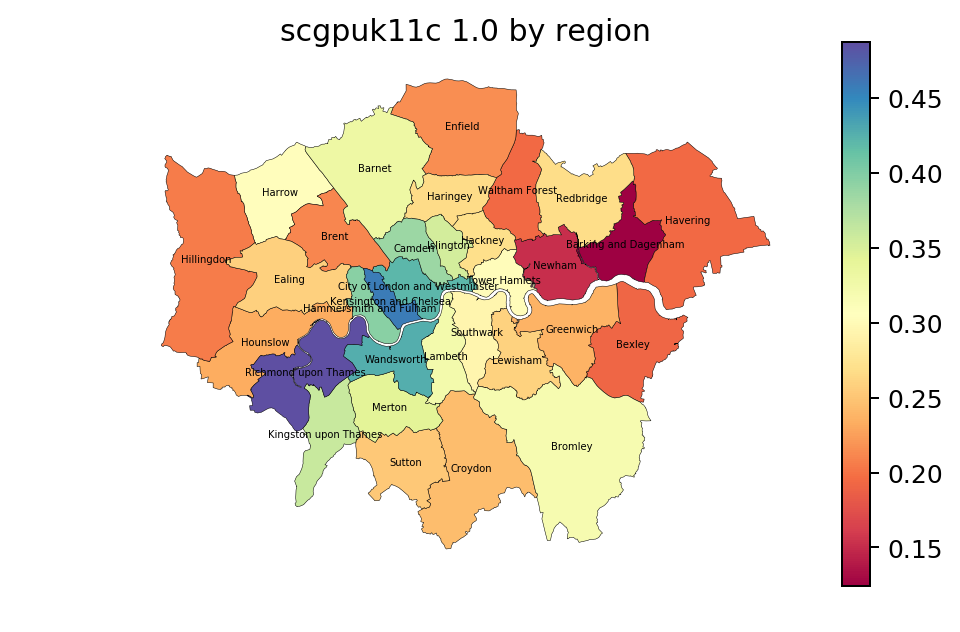

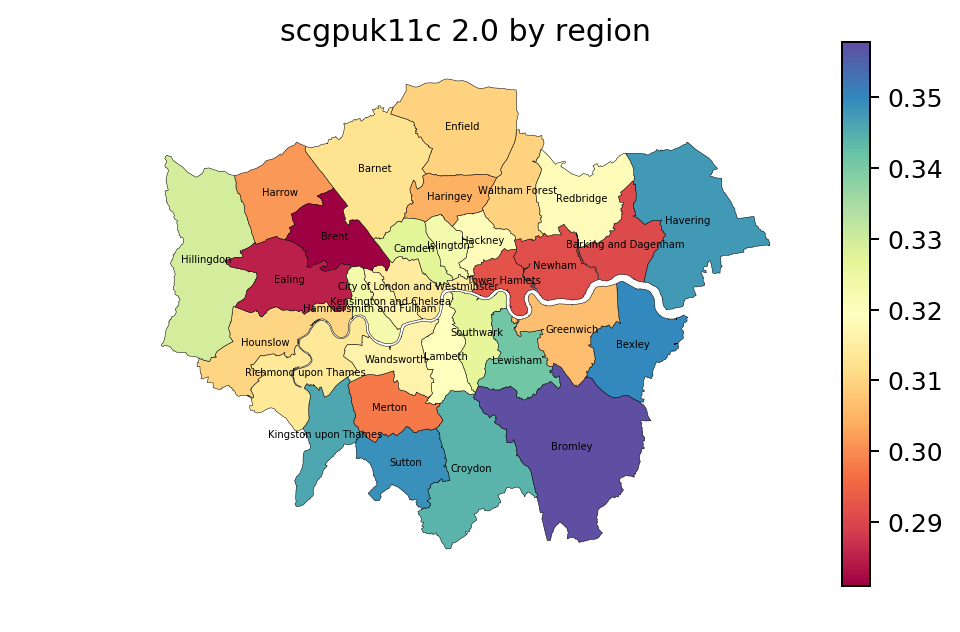

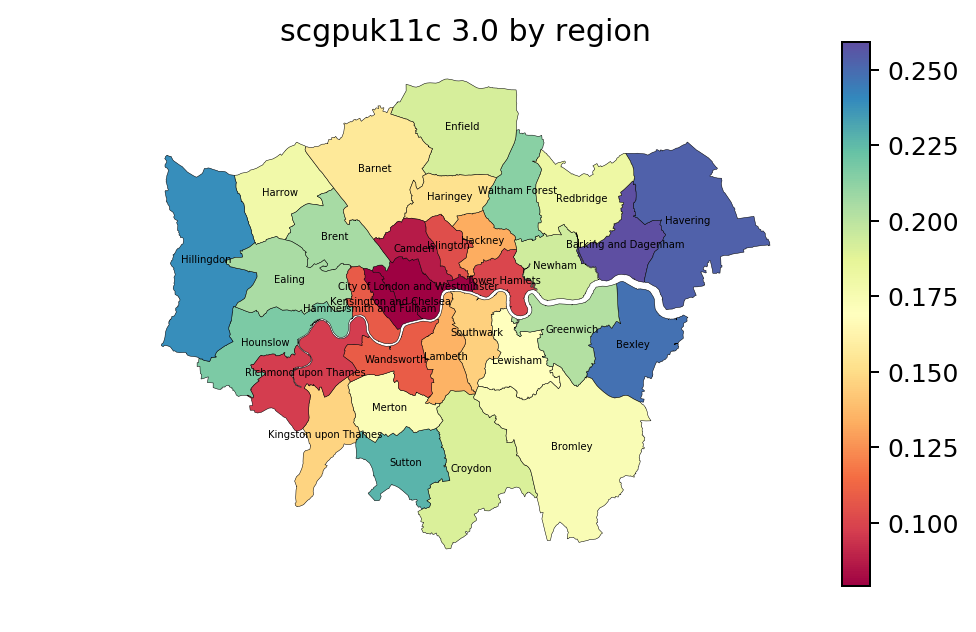

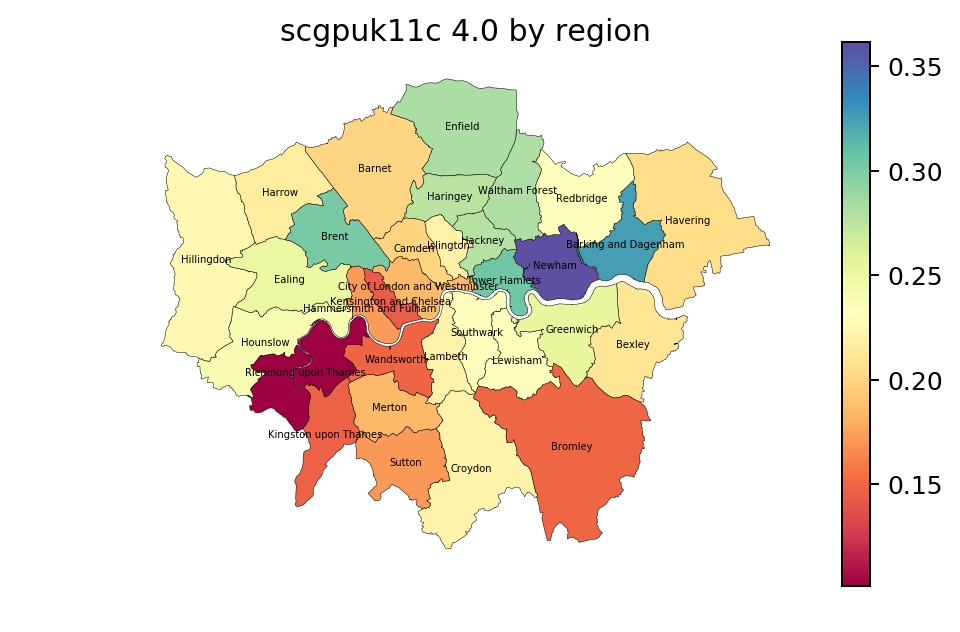

In [667]:
inc_by_geo_lon = attribute_by_geo(data_2011_ew, 'scgpuk11c', lon_geo2gla_dict, ew_gla_map, ignore_missing=True, label=True)

We can also look at the employment status variable. It counts people into two broad classes of economically active or inactive. Within the former, full-time (FT) students and part-time (PT) employees are counted separately. Within the latter, retirees, students, caregivers, and disabled are counted separately.

	Value = 1.0	Label = Econ active (exc FT students), PT employee
	Value = 2.0	Label = Econ active (exc FT students),  FT employee
	Value = 3.0	Label = Econ active (exc FT students) SE with emps, PT
	Value = 4.0	Label = Econ active (exc FT students) SE with emps, FT
	Value = 5.0	Label = Econ active (exc FT students) SE without emps, PT
	Value = 6.0	Label = Econ active (exc FT students) SE without emps, FT
	Value = 7.0	Label = Econ active (exc FT students) seek/will take emp in 2 wks
	Value = 8.0	Label = Econ active FT students, in employment
	Value = 9.0	Label = Econ active FT students, unemp, seek/will take emp in 2 wks
	Value = 10.0	Label = Economically Inactive, Retired
	Value = 11.0	Label = Economically Inactive, Student
	Value = 12.0	Label = Economically Inactive, Looking after home/family
	Value = 13.0	Label = Economically Inactive, Permanently sick/disabled
	Value = 14.0	Label = Economically Inactive, Other

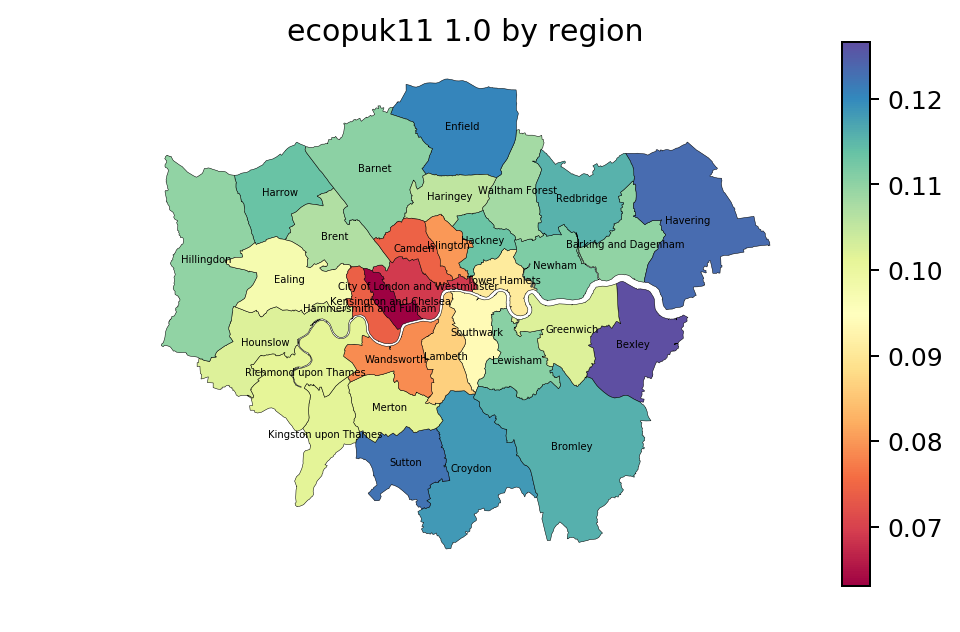

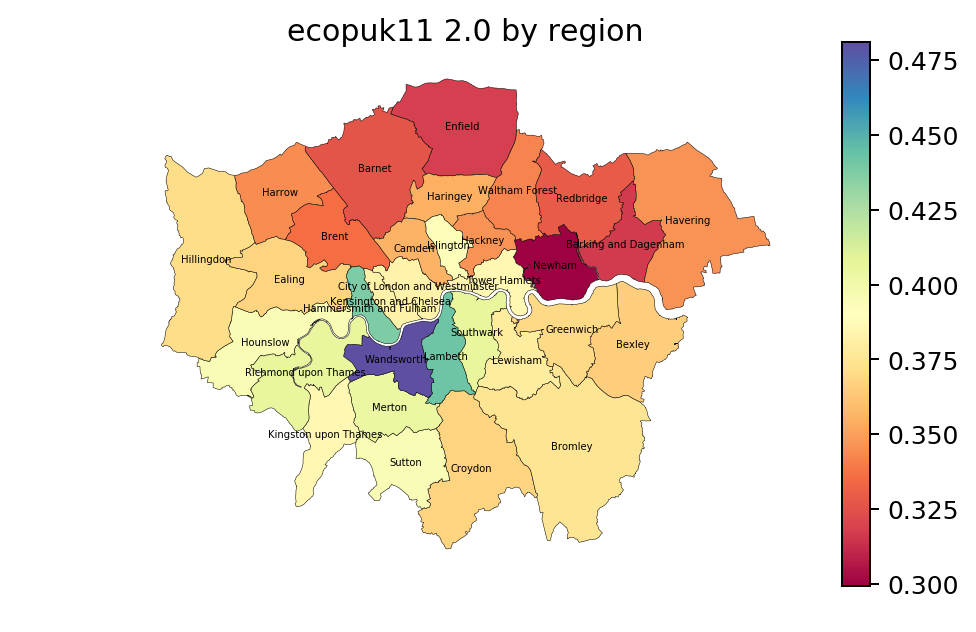

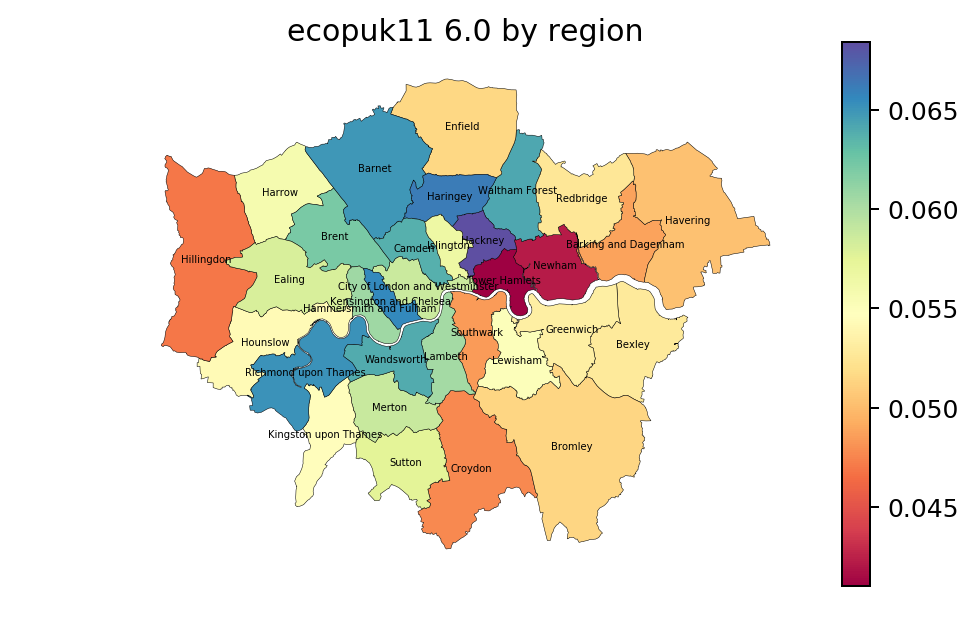

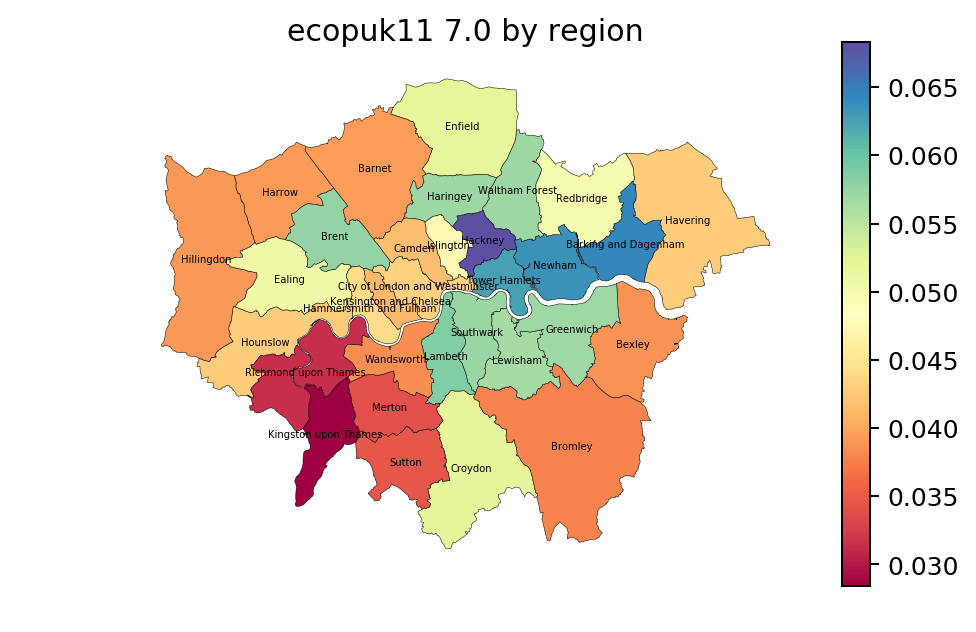

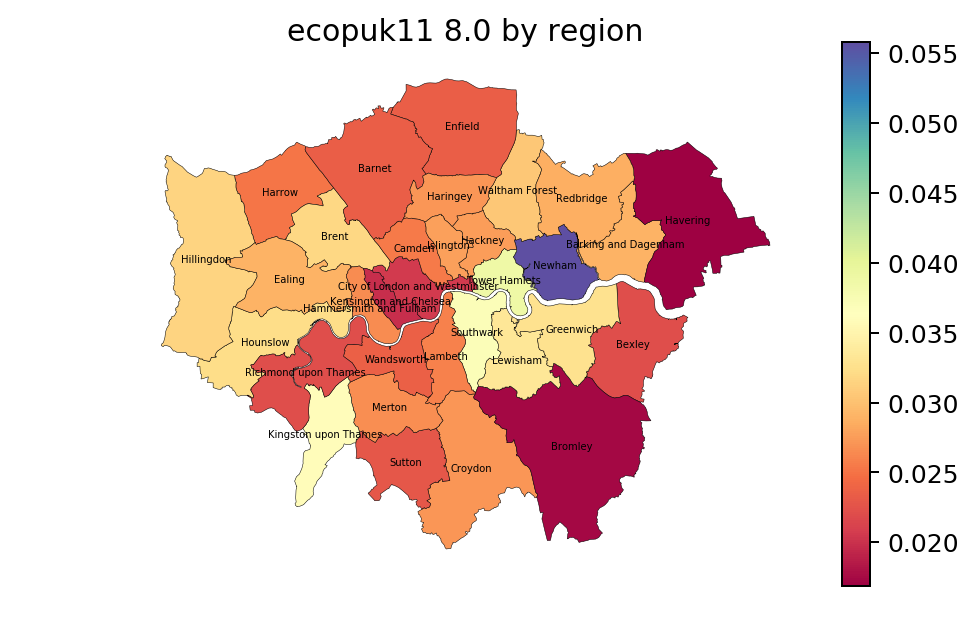

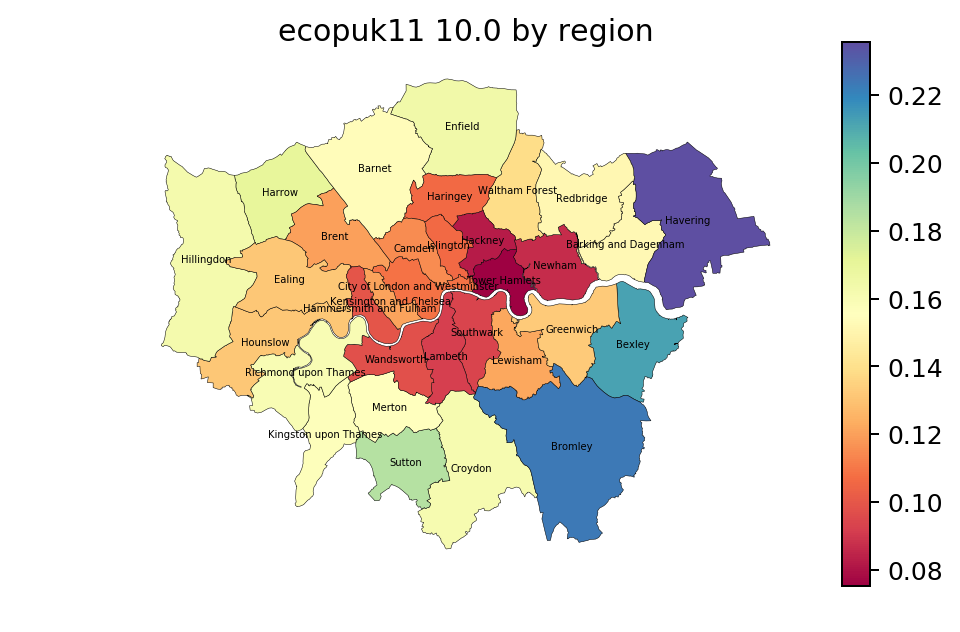

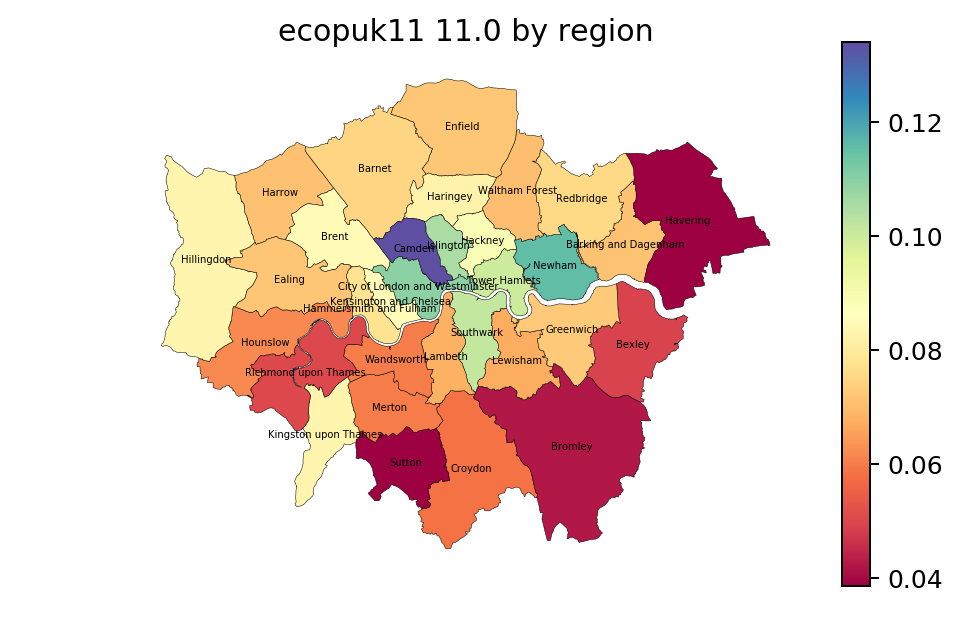

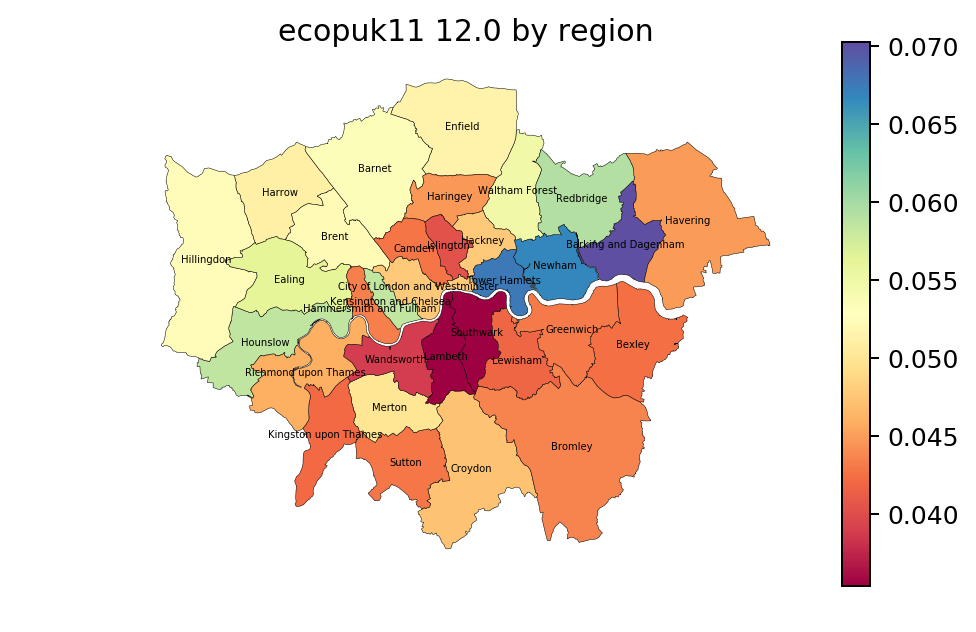

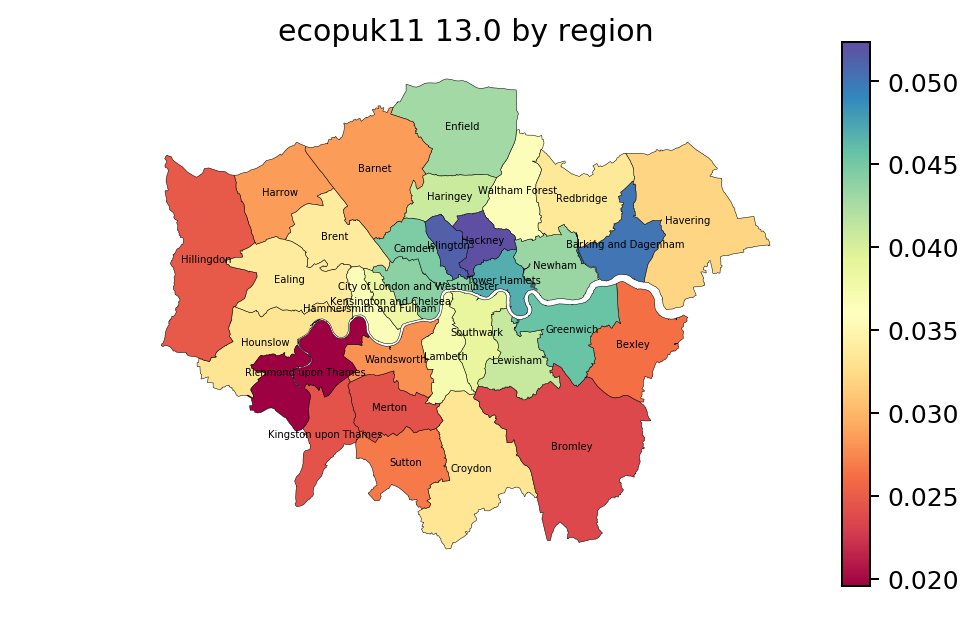

In [824]:
emp_by_geo_lon = attribute_by_geo(data_2011_ew, 'ecopuk11', lon_geo2gla_dict, ew_gla_map, plot_thresh=0.05, ignore_missing=True, label=True)

There are also some cultural variables like religion, language and ethnicity.

	Value = 1.0	Label = No religion
	Value = 2.0	Label = Christian (inc C of E, Catholic, Protestant, all other Christian denoms)
	Value = 3.0	Label = Buddhist
	Value = 4.0	Label = Hindu
	Value = 5.0	Label = Jewish
	Value = 6.0	Label = Muslim
	Value = 7.0	Label = Sikh
	Value = 8.0	Label = Other religion
	Value = 9.0	Label = Not stated

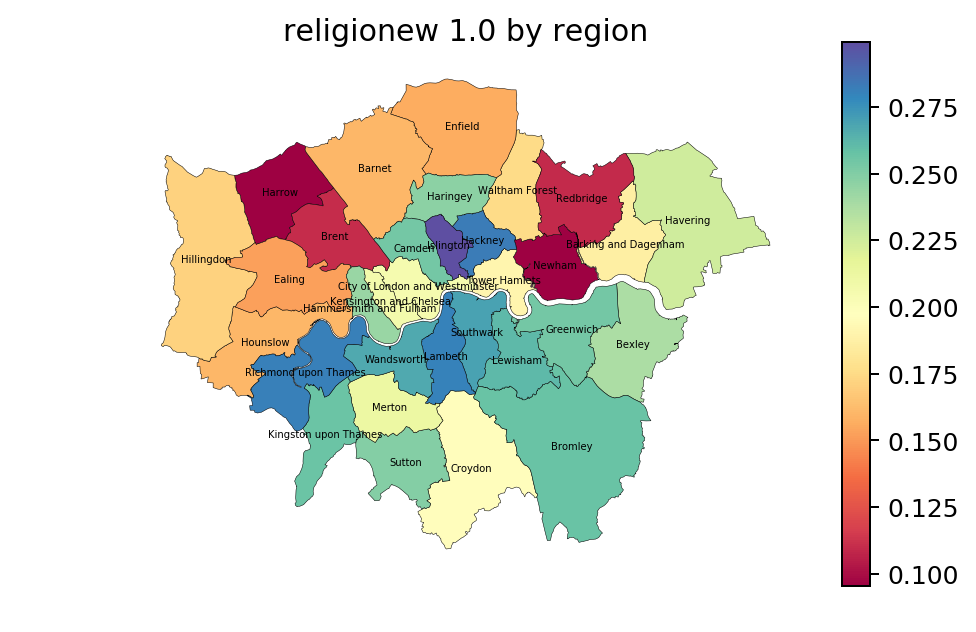

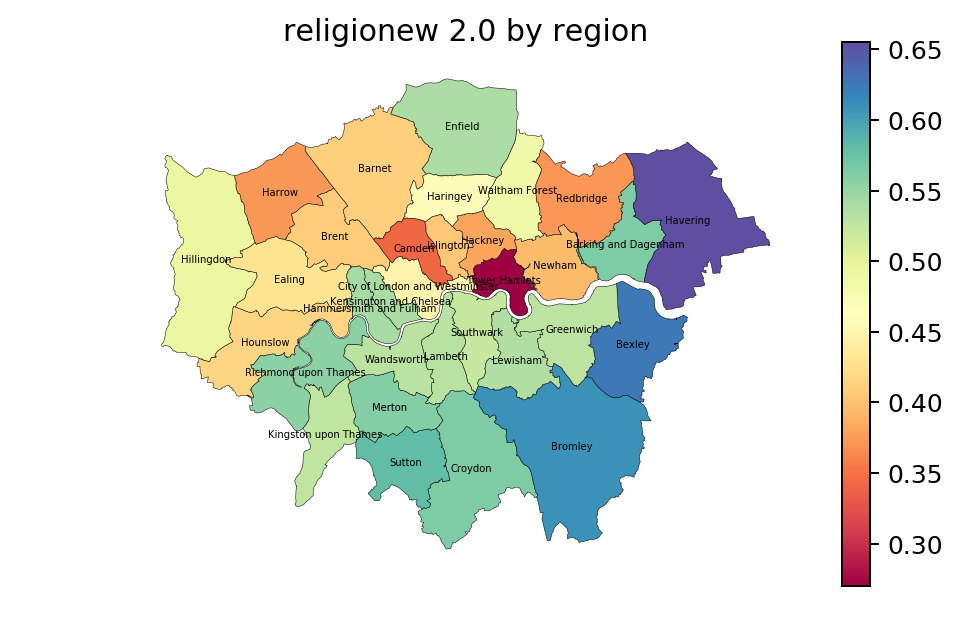

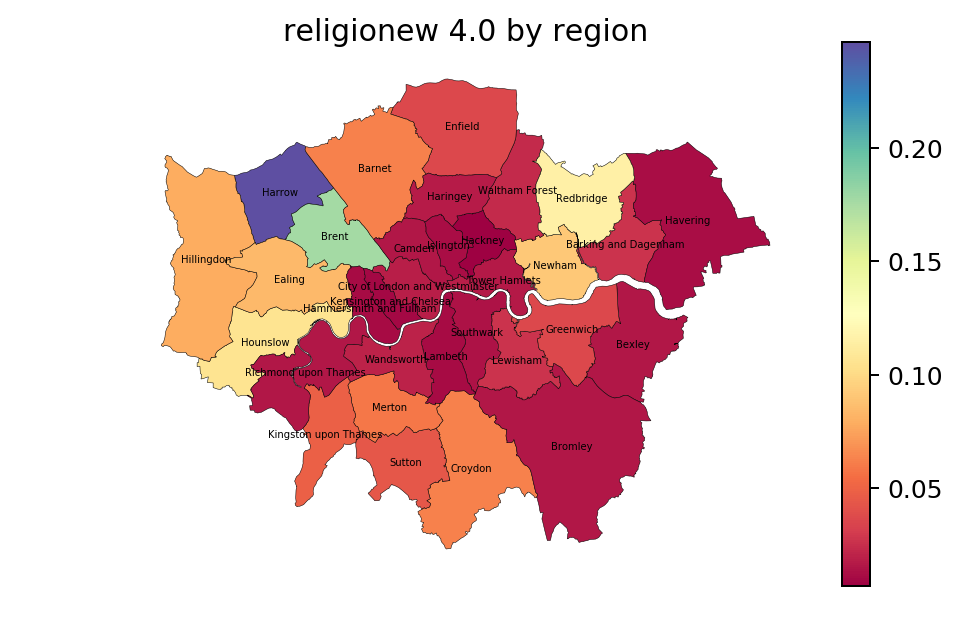

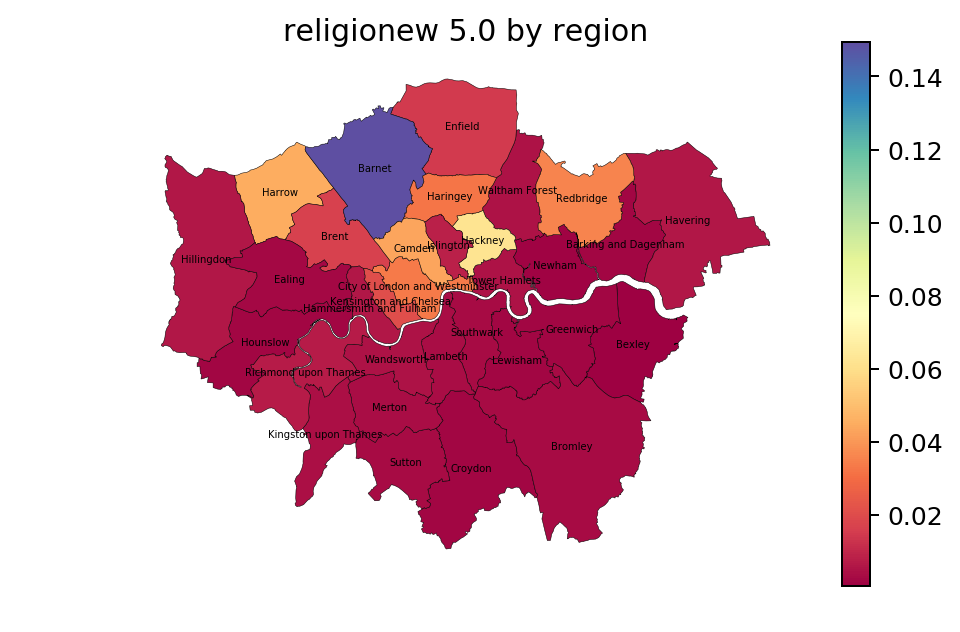

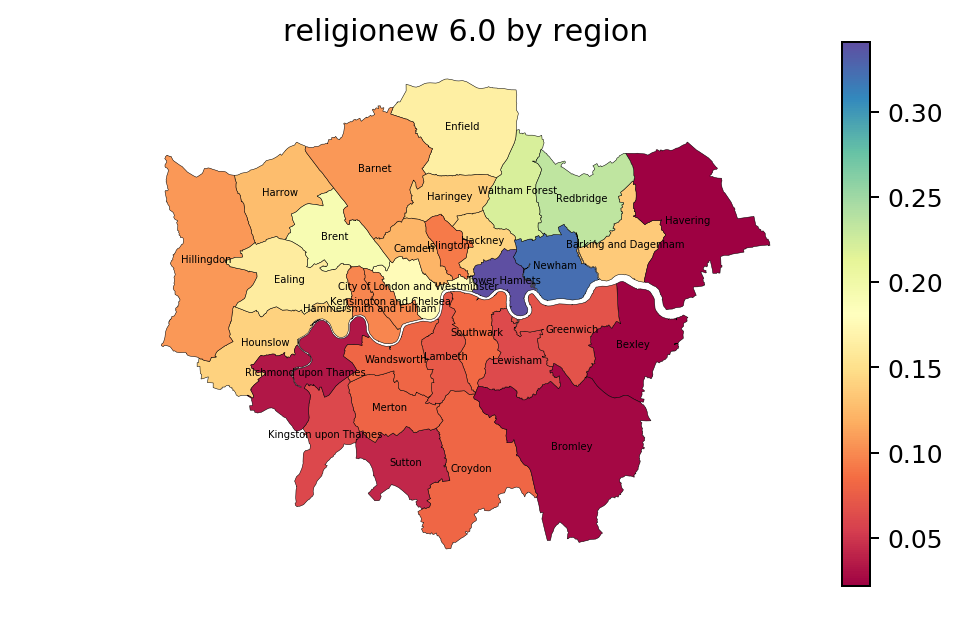

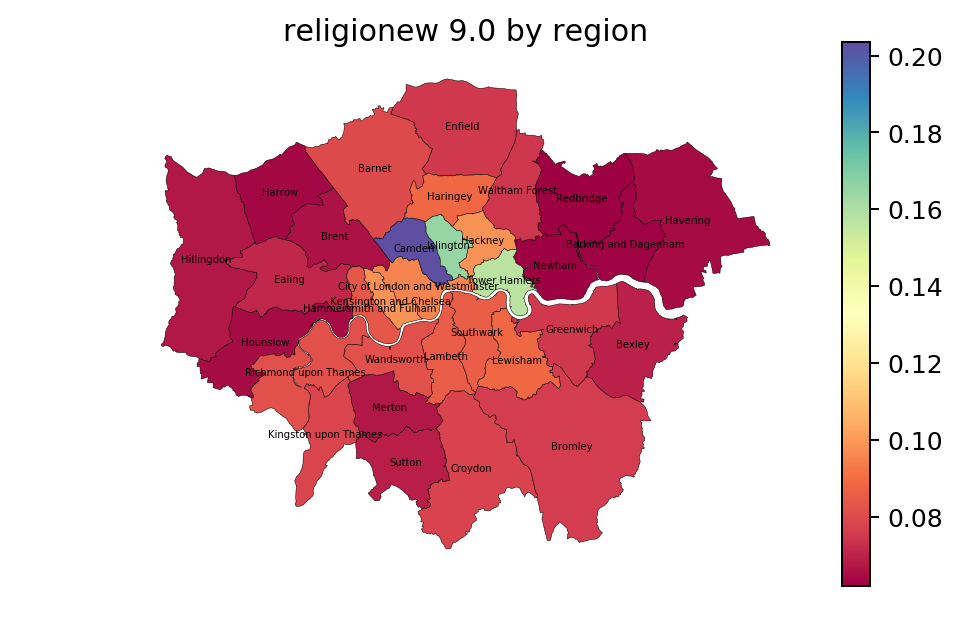

In [668]:
rel_by_geo_lon = attribute_by_geo(data_2011_ew, 'religionew', lon_geo2gla_dict, ew_gla_map, ignore_missing=True, label=True)

	Value = 1.0	Label = English (or Welsh in Wales)
	Value = 2.0	Label = Polish
	Value = 3.0	Label = Panjabi
	Value = 4.0	Label = Urdu
	Value = 5.0	Label = Bengali (with Sylheti and Chatgaya)
	Value = 6.0	Label = Gujarati
	Value = 7.0	Label = Arabic
	Value = 8.0	Label = French
	Value = 9.0	Label = Other

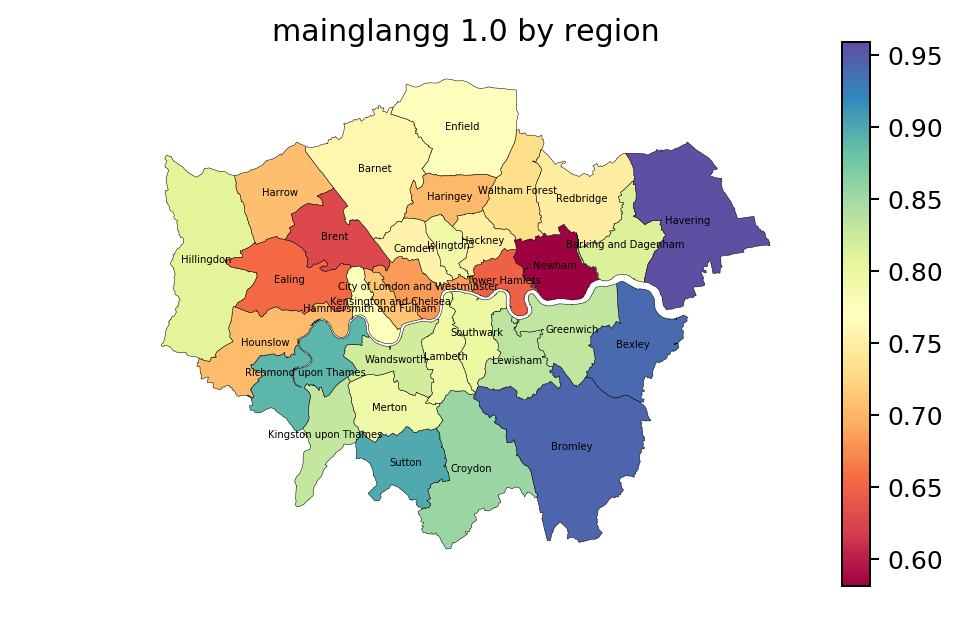

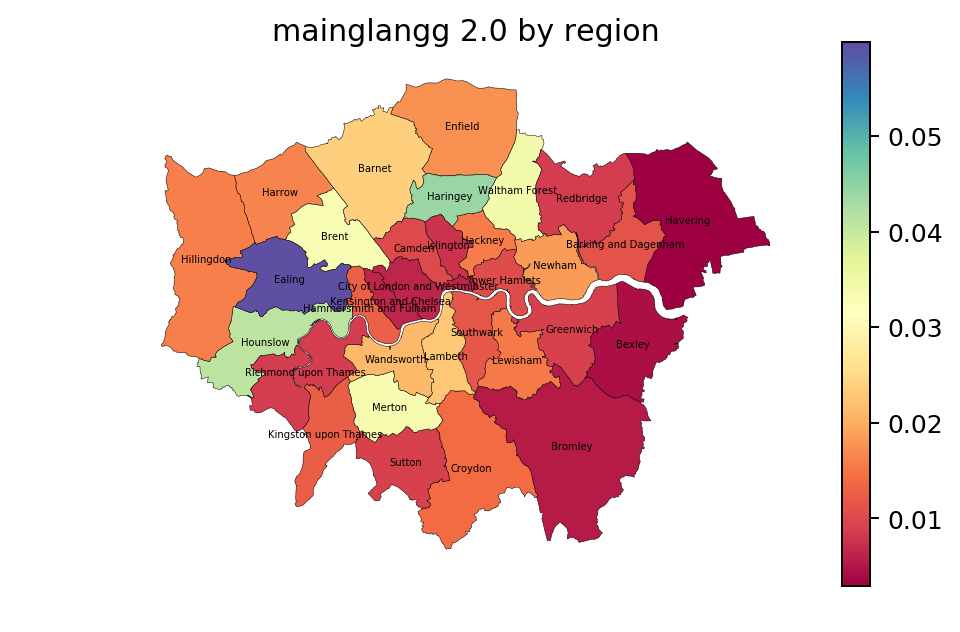

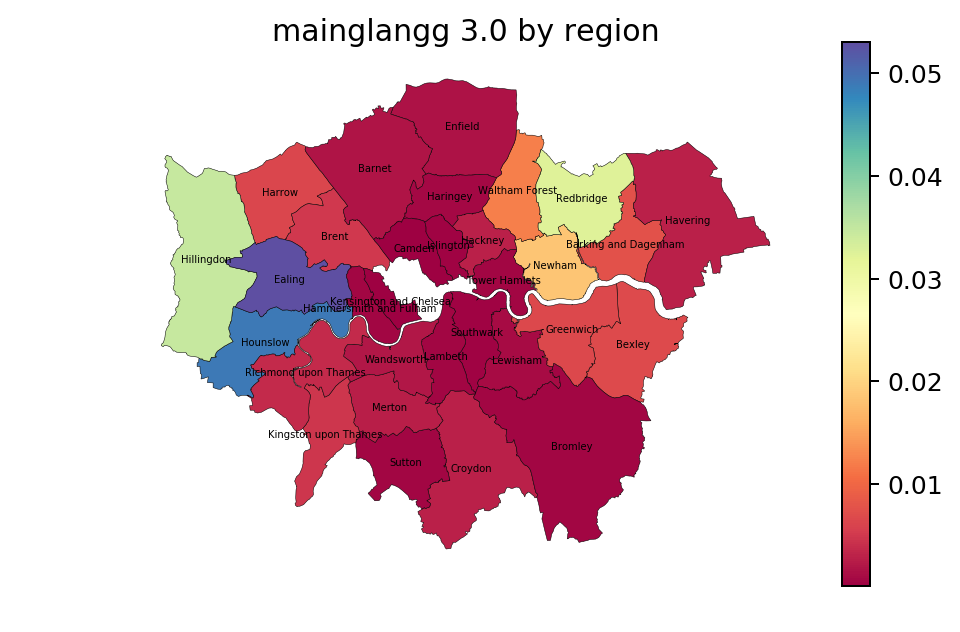

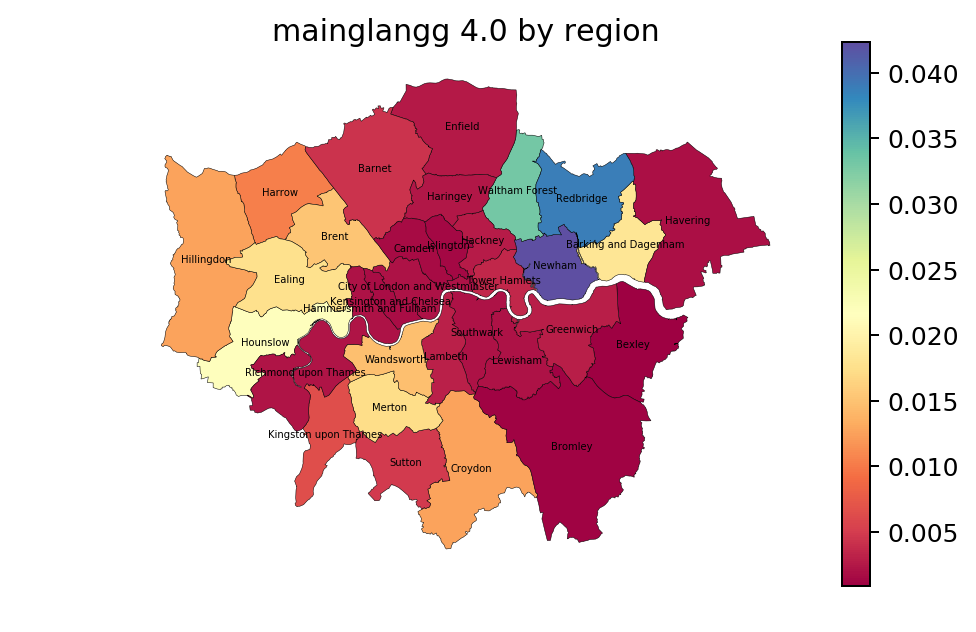

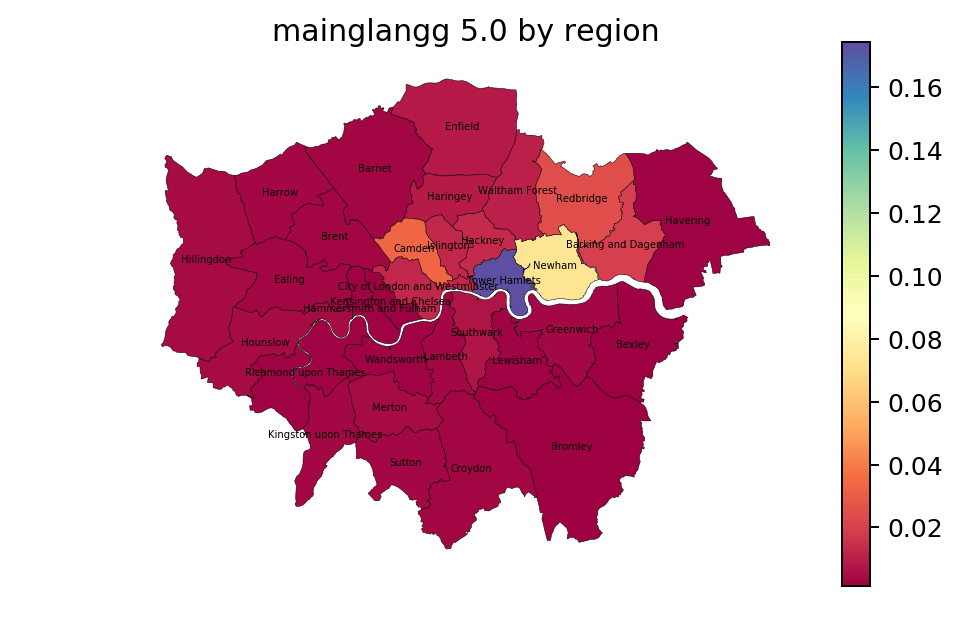

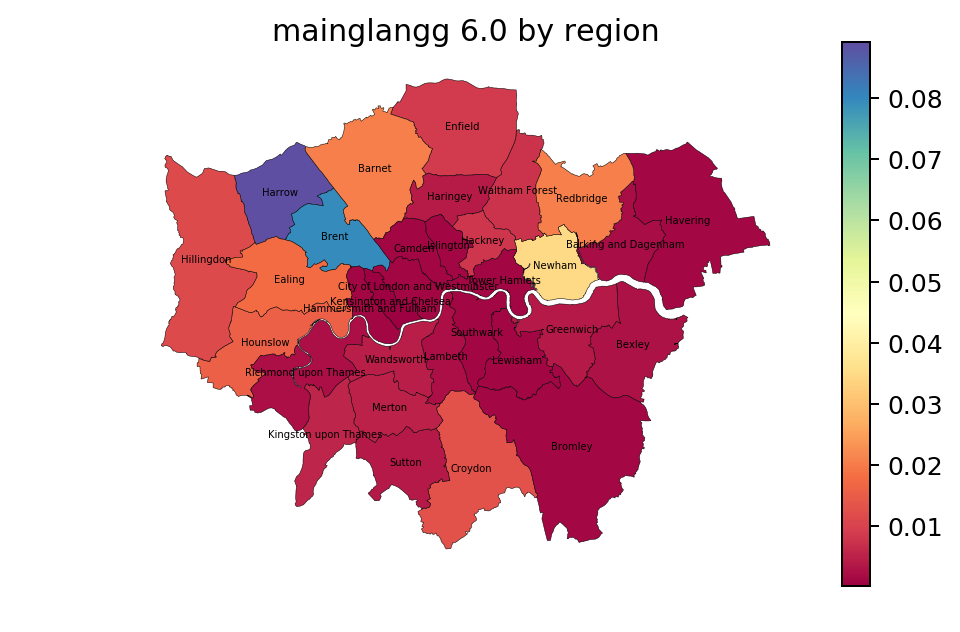

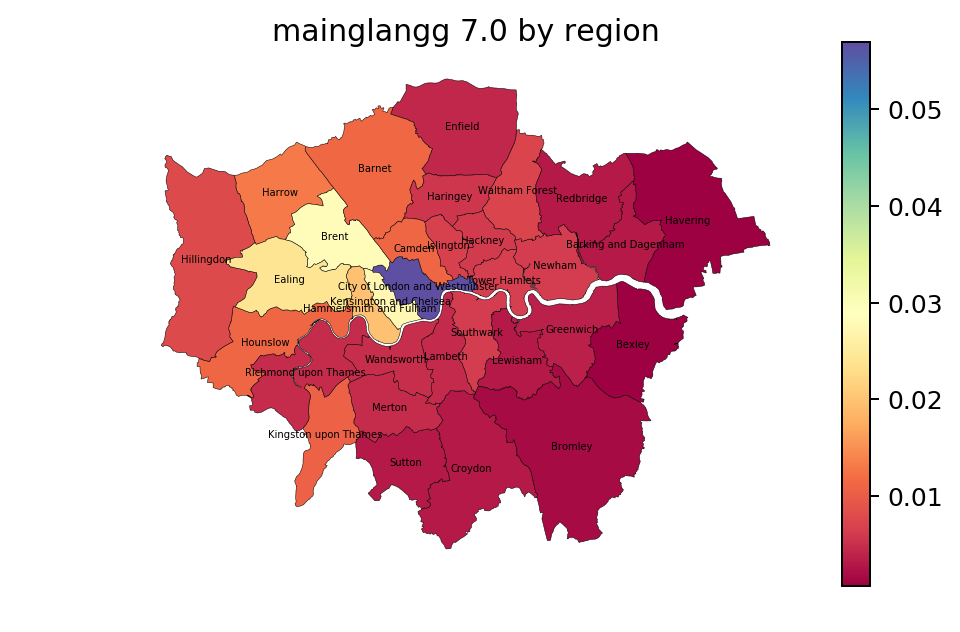

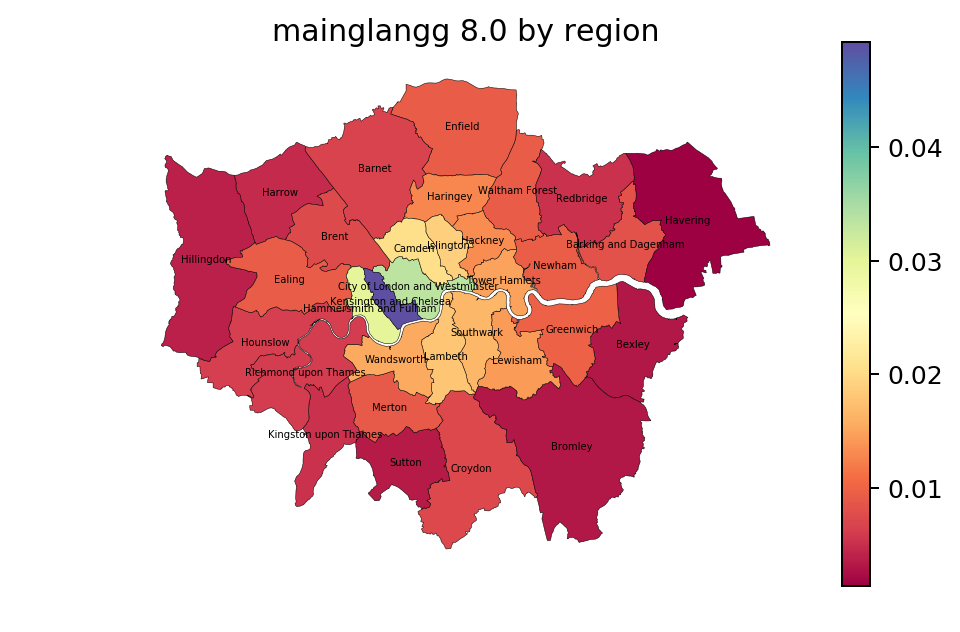

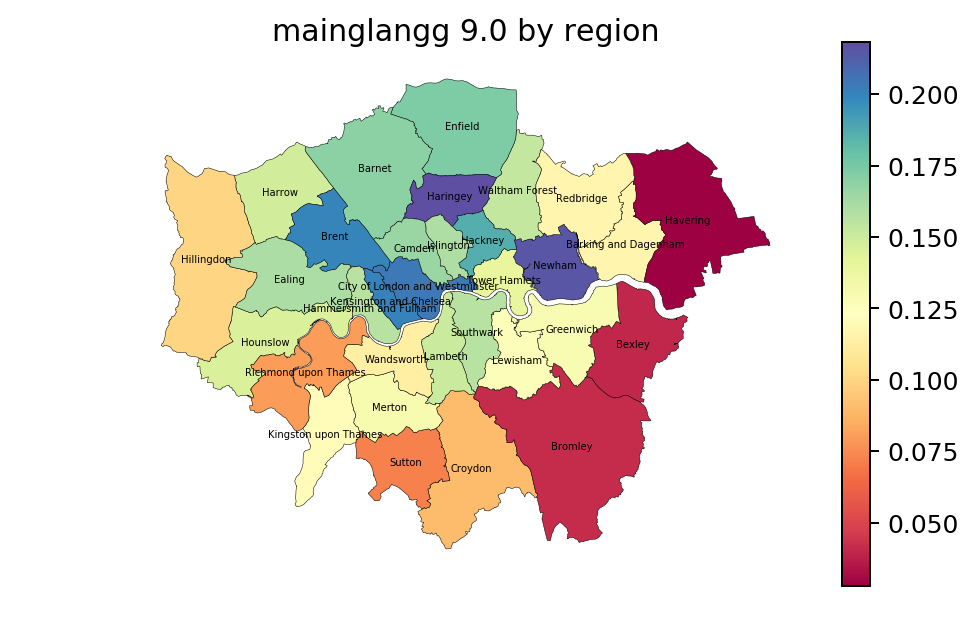

In [820]:
lan_by_geo_lon = attribute_by_geo(data_2011_ew, 'mainglangg', lon_geo2gla_dict, ew_gla_map, plot_thresh=0., ignore_missing=True, label=True)

	Value = 1.0	Label = White:English/Welsh/Scottish/N Irish/British
	Value = 2.0	Label = White: Irish
	Value = 3.0	Label = White: Other White
	Value = 4.0	Label = Mixed:multi eth group: White/Black Carib./White/Black African
	Value = 5.0	Label = Mixed/multi eth group; White + Asian/Other mixed
	Value = 6.0	Label = Asian/Asian British: Indian
	Value = 7.0	Label = Asian/Asian British: Pakistani
	Value = 8.0	Label = Asian/Asian British: Bangladeshi
	Value = 9.0	Label = Asian/Asian British: Chinese
	Value = 10.0	Label = Asian/Asian British: Other Asian
	Value = 11.0	Label = Black/African/Carib./Black British: African
	Value = 12.0	Label = Black/African/Carib./Black British: Carib./Other Black
	Value = 13.0	Label = Other ethnic group: Any other ethnic group

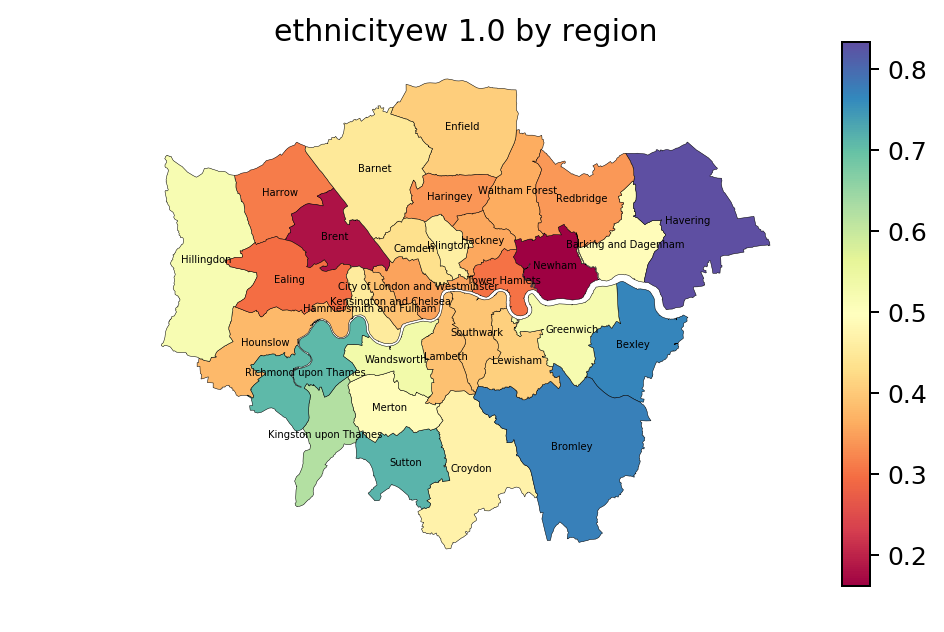

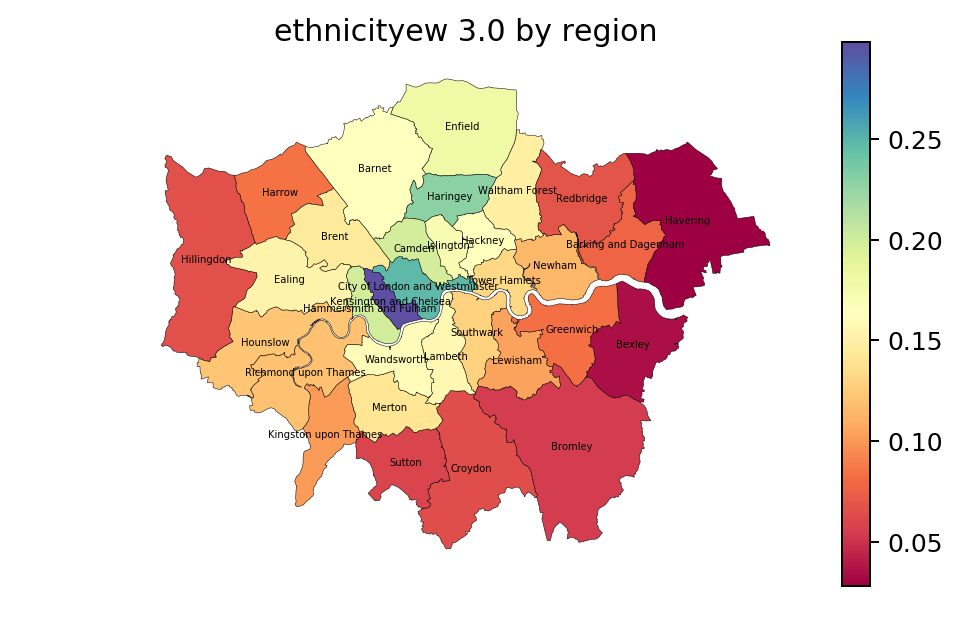

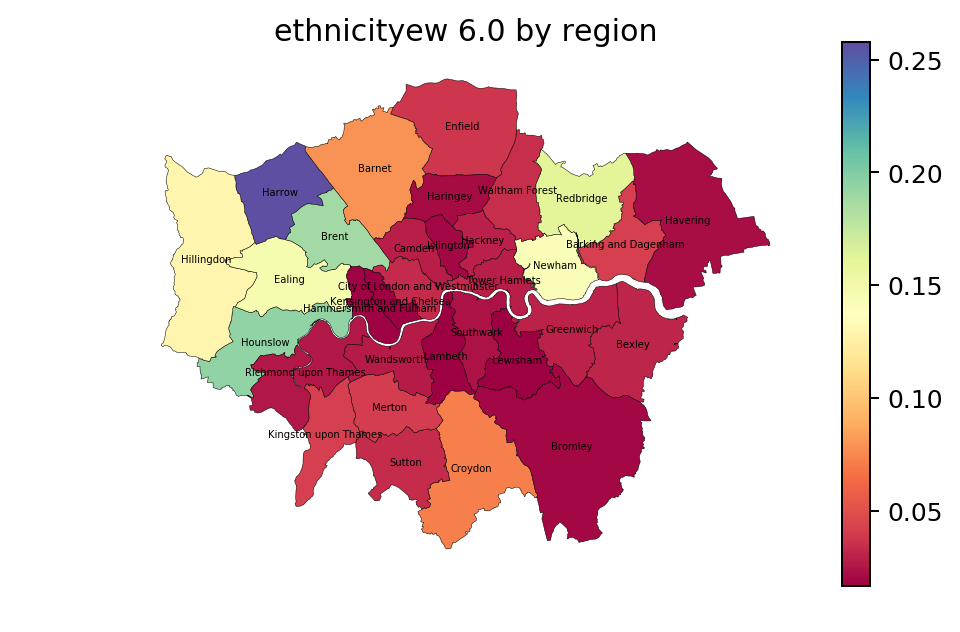

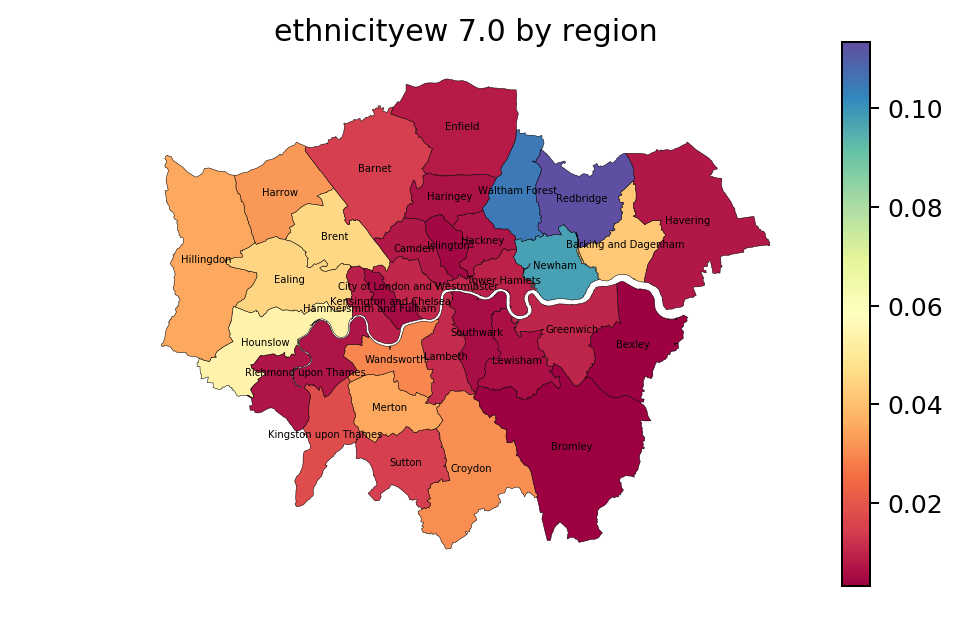

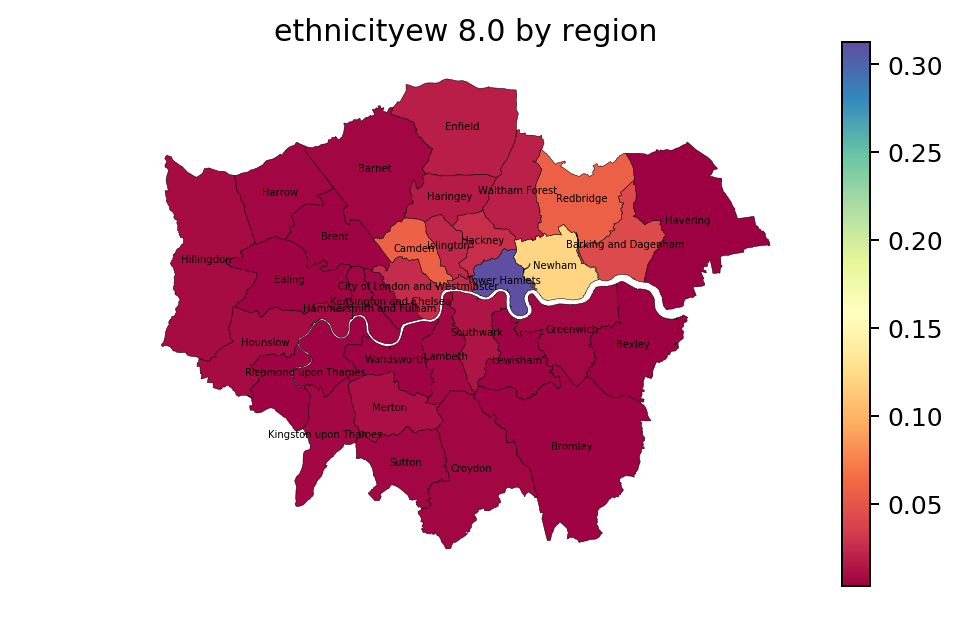

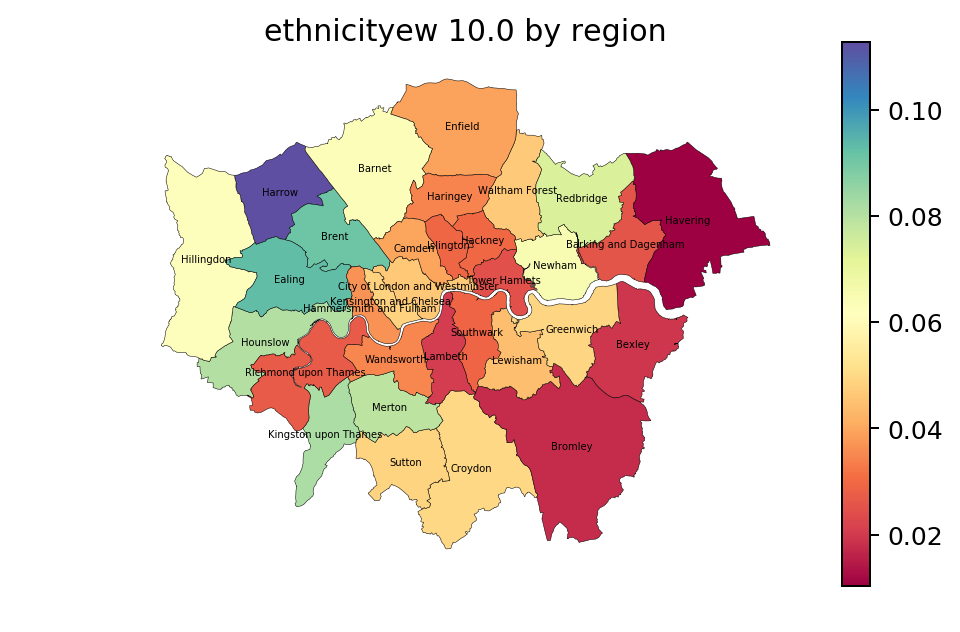

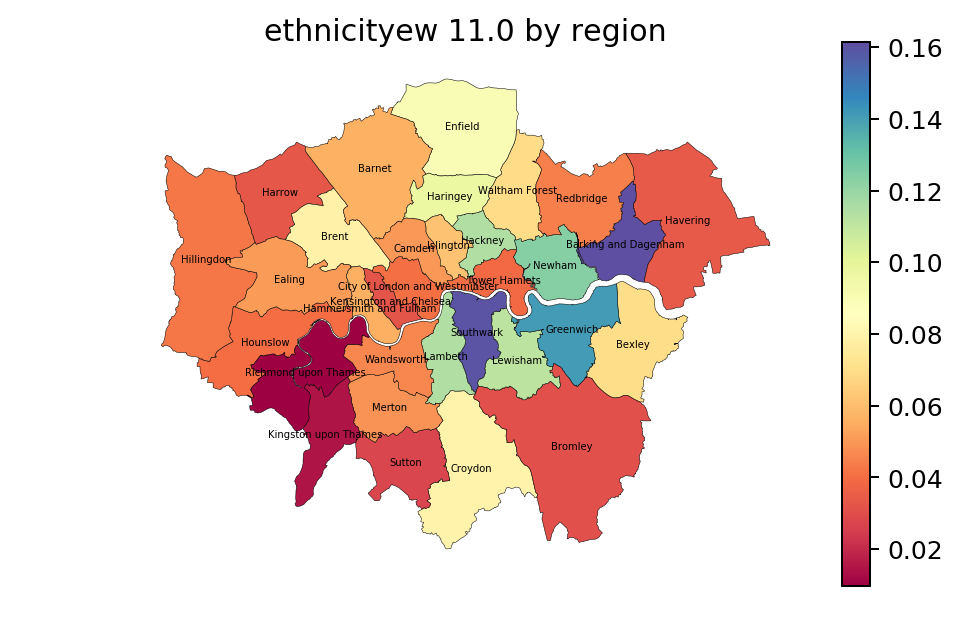

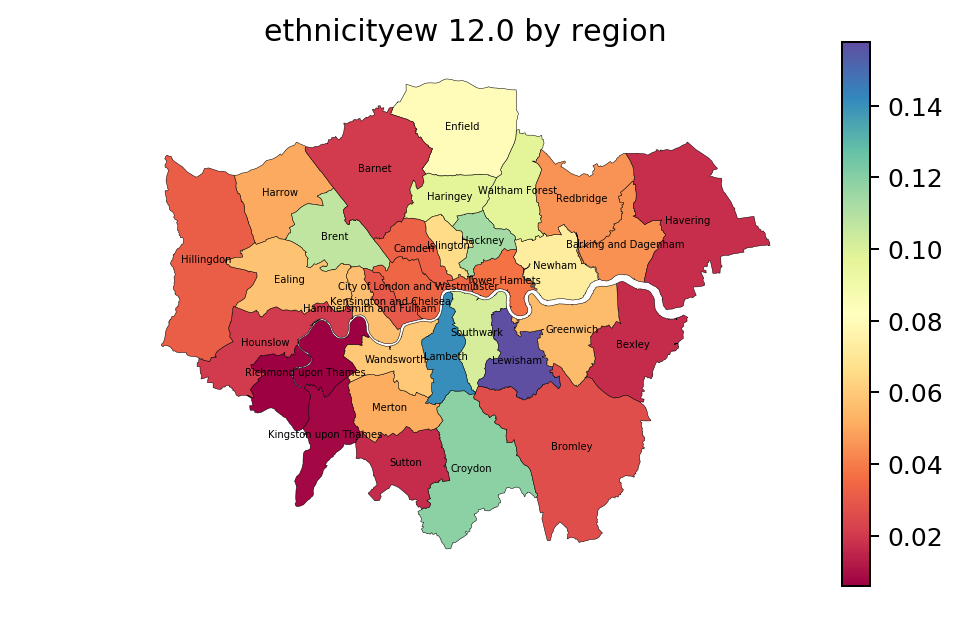

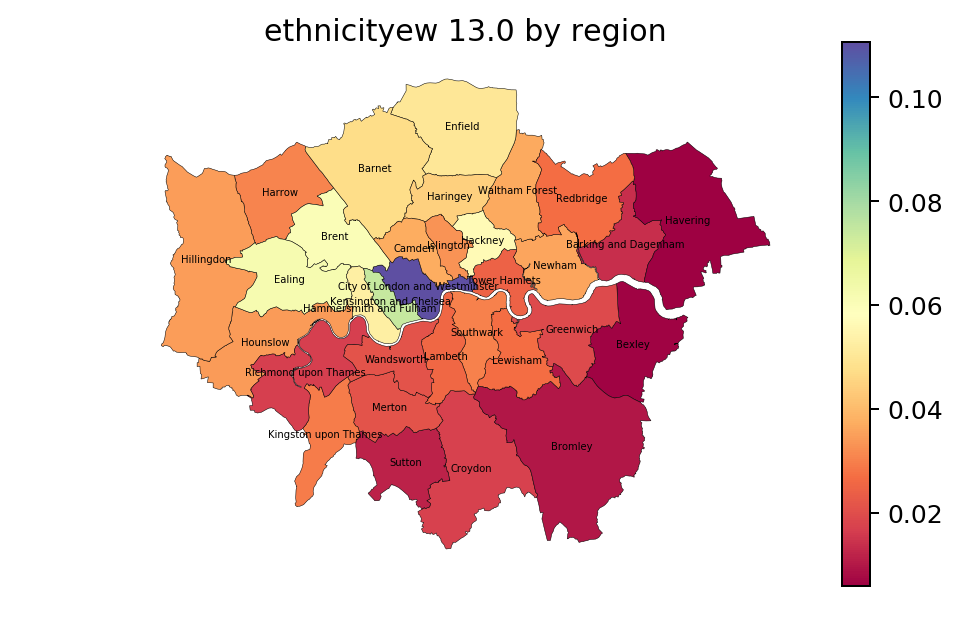

In [669]:
eth_by_geo_lon = attribute_by_geo(data_2011_ew, 'ethnicityew', lon_geo2gla_dict, ew_gla_map, ignore_missing=True, label=True)

## Designing Survey Question Categories

Looking at the ethnicity map poses an interesting question. The census question asks for ethnicity at a fine granularity. However, we have been "grouping" related ethnic identities together to form just 4 broad categories: white, Asian, black, and others. Intuitively, these categories would work if the subcategories tend to cohabit. But the maps for London above do not give that impression. For example, British white and other white do not cohabit. Similarly, Indians, Pakistanis and Bangladeshis inhabit distinct boroughs. The African and Caribbean black communities seem less segregated, so could perhaps be clubbed together.

Clearly, this spatial judgement of category mixing is conditioned on the scale of geography. If we look at the entire UK, we might reobtain the broad grouping we intuit. So perhaps we need to tune this question in our survey depending on whether we want it to focus on London or the entire UK.

To quantify this intuition, we write a function which returns the Spearman correlation between two categories of a Blau dimensions by the grouped-LA. We can also calculate higher-order correlations (correlations of correlations) to better deduce this structure.

In [811]:
def label_correlation_by_geo(df_by_geo, geo_list=[], plot=True, axis=0, order=1):
    from scipy.stats import spearmanr
    from pandas import concat, DataFrame
    if plot:
        import matplotlib.pyplot as plt
        import seaborn as sns
    if len(geo_list)!=0: df_by_geo = df_by_geo.loc[list(geo_list)]
    matrix = concat([df_by_geo.loc[:, lab] for lab in df_by_geo.index.levels[1]], axis=1)
    matrix.columns = df_by_geo.index.levels[1]
    out = [matrix]
    i = 0
    while i<order:
        i += 1
        rho, pval = spearmanr(out[-1], axis=axis)
        rho = DataFrame(rho, index=df_by_geo.index.levels[1], columns=df_by_geo.index.levels[1])
        pval = DataFrame(pval, index=df_by_geo.index.levels[1], columns=df_by_geo.index.levels[1])
        out.append(pval)
        out.append(rho)
        if plot:
            sns.heatmap(rho, annot=True, center=0, square=True, cbar_kws={'label': 'rho'+str(i)})
            plt.show()
    return out

We first run this function for grouped LAs across UK, then across London.

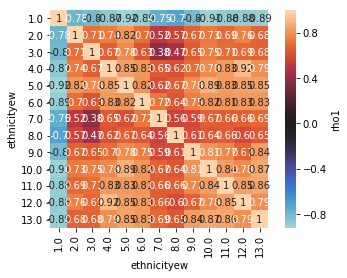

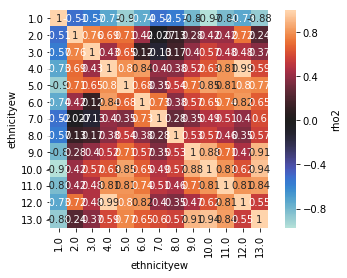

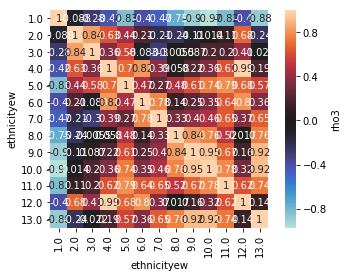

In [814]:
eth_corr_uk = label_correlation_by_geo(eth_by_geo_lon, order=3)

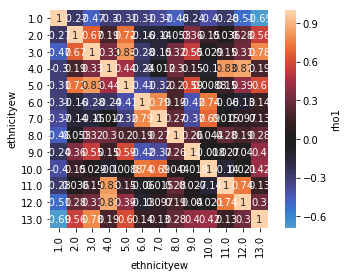

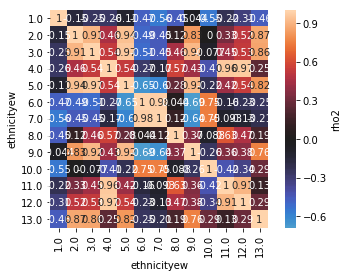

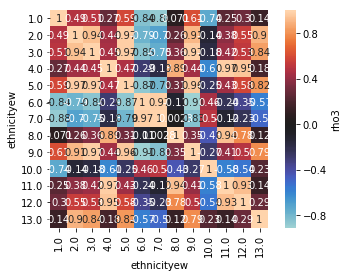

In [817]:
eth_corr_lon = label_correlation_by_geo(eth_by_geo_lon, lon_geo2gla_dict.values(), order=3)

It's easy to note from the correlation matrices, particularly for the highest order, that there is a clustered structure to ethnic categories. To see this more precisely, we can run hierarchical clustering on the order-3 correlation matrix and look at the dendrogram.

In [892]:
def hclust(data, thresh=1., transpose=True):
    from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
    if transpose: idx = list(data)
    else: idx = list(data.index)
    data = data.fillna(0).values
    if transpose: data = data.transpose()
    z = linkage(data, 'single')
    plot = dendrogram(z, labels=idx)
    plt.show()
    mems = fcluster(z, t=thresh, criterion='distance')
    clusts = [set() for i in range(max(mems))]
    for i in range(len(idx)):
        clusts[mems[i]-1].add(idx[i])
    return clusts

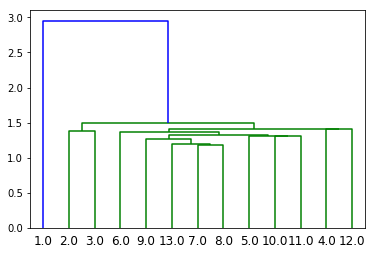

[{2.0}, {3.0}, {7.0}, {8.0}, {13.0}, {9.0}, {10.0}, {11.0}, {5.0}, {6.0}, {4.0}, {12.0}, {1.0}]


In [893]:
eth_clusters_uk = hclust(eth_corr_uk[-1])
print(eth_clusters_uk)

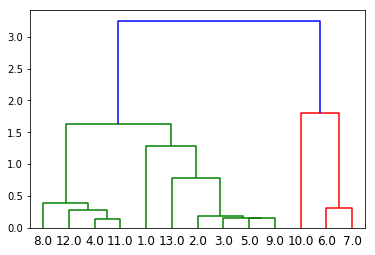

[{8.0, 11.0, 4.0, 12.0}, {9.0, 2.0, 3.0, 5.0}, {13.0}, {1.0}, {6.0, 7.0}, {10.0}]


In [894]:
eth_clusters_lon = hclust(eth_corr_lon[-1], thresh=0.5)
print(eth_clusters_lon)

Clearly, for the entire UK, the broadest ethnic division is between white and non-white, and the rest are almost equidistant. Which means we can either stick with a question of "are you white?" or ask for the full breakdown, as the census rightly does.

For London, however, the structure is more interesting due to ethnic diversity. The broadest ethnic division is between Asian versus the rest. Within the former, it divides between South Asian versus Other Asians. Within the latter, it divides between white and non-white (Bangladeshi/Africa/Caribbean). Amongst white, the British white separate out from the remaining white.

This diversity encourages us to not group racial identities.